In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-21 15:57:42,865] A new study created in memory with name: no-name-a9d62a36-add7-4f0e-8cdd-e2a86ba86736
[I 2025-05-21 16:03:17,306] Trial 0 finished with value: 2.44314444065094 and parameters: {'lr': 0.07836819018017702, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.24273991669471334}. Best is trial 0 with value: 2.44314444065094.


Cross Validation Accuracies:
[2.5040996074676514, 1.2439132928848267, 3.432906150817871, 1.7791869640350342, 3.2556161880493164]
Mean Cross Validation Accuracy:
2.44314444065094
Standard Deviation of Cross Validation Accuracy:
0.8393389055824093


[I 2025-05-21 16:07:27,765] Trial 1 finished with value: 0.05890416651964188 and parameters: {'lr': 0.0019662151547202382, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.33598639302892674}. Best is trial 1 with value: 0.05890416651964188.


Cross Validation Accuracies:
[0.03909918665885925, 0.03249850124120712, 0.09931650012731552, 0.04602273553609848, 0.077583909034729]
Mean Cross Validation Accuracy:
0.05890416651964188
Standard Deviation of Cross Validation Accuracy:
0.025446088651556627


[I 2025-05-21 16:11:53,264] Trial 2 finished with value: 0.025235041603446008 and parameters: {'lr': 0.0012574799302263078, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.14684518373949962}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.021979298442602158, 0.026576993986964226, 0.026124799624085426, 0.02506709285080433, 0.026427023112773895]
Mean Cross Validation Accuracy:
0.025235041603446008
Standard Deviation of Cross Validation Accuracy:
0.0017112215383402226


[I 2025-05-21 16:18:41,133] Trial 3 finished with value: 0.0980526328086853 and parameters: {'lr': 0.036112899486717566, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2068351506887725}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.1249200776219368, 0.06496795266866684, 0.05555466562509537, 0.1071665957570076, 0.1376538723707199]
Mean Cross Validation Accuracy:
0.0980526328086853
Standard Deviation of Cross Validation Accuracy:
0.032477239294530495


[I 2025-05-21 16:25:51,616] Trial 4 finished with value: 0.04765689745545387 and parameters: {'lr': 0.004870751317352493, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2930895093634781}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.04238283634185791, 0.03389832749962807, 0.06638778746128082, 0.050579510629177094, 0.04503602534532547]
Mean Cross Validation Accuracy:
0.04765689745545387
Standard Deviation of Cross Validation Accuracy:
0.010801581797593858


[I 2025-05-21 16:31:28,633] Trial 5 finished with value: 0.6660082161426544 and parameters: {'lr': 0.010937175064079515, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2122568538490154}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.4915445148944855, 0.7374706864356995, 0.6118758916854858, 0.6084014773368835, 0.8807485103607178]
Mean Cross Validation Accuracy:
0.6660082161426544
Standard Deviation of Cross Validation Accuracy:
0.13259465040598553


[I 2025-05-21 16:35:16,042] Trial 6 finished with value: 0.06721425577998161 and parameters: {'lr': 0.22374417005412528, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.25659338643704765}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.07301659882068634, 0.06865924596786499, 0.0673210471868515, 0.0525609590113163, 0.07451342791318893]
Mean Cross Validation Accuracy:
0.06721425577998161
Standard Deviation of Cross Validation Accuracy:
0.007794403194991169


[I 2025-05-21 16:39:55,847] Trial 7 finished with value: 0.056461059302091596 and parameters: {'lr': 0.004887915587597827, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.15591763375174153}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.06830917298793793, 0.04749055206775665, 0.0592176578938961, 0.04796300828456879, 0.05932490527629852]
Mean Cross Validation Accuracy:
0.056461059302091596
Standard Deviation of Cross Validation Accuracy:
0.007859581650580837


[I 2025-05-21 16:45:30,822] Trial 8 finished with value: 0.17222115248441697 and parameters: {'lr': 0.023862529082290126, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3581973323111173}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.11111246794462204, 0.15672339498996735, 0.17169955372810364, 0.1910506784915924, 0.23051966726779938]
Mean Cross Validation Accuracy:
0.17222115248441697
Standard Deviation of Cross Validation Accuracy:
0.03931409862735424


[I 2025-05-21 16:49:21,514] Trial 9 finished with value: 0.5356071829795838 and parameters: {'lr': 0.12490745055271156, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4105459910023127}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.3563741445541382, 0.43590250611305237, 0.7453874945640564, 0.8676662445068359, 0.2727055251598358]
Mean Cross Validation Accuracy:
0.5356071829795838
Standard Deviation of Cross Validation Accuracy:
0.23041431631193685


[I 2025-05-21 16:53:25,244] Trial 10 finished with value: 0.3057578980922699 and parameters: {'lr': 0.0010442358839431079, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.47949791144996823}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.30952271819114685, 0.25569650530815125, 0.30853334069252014, 0.3176048696041107, 0.33743205666542053]
Mean Cross Validation Accuracy:
0.3057578980922699
Standard Deviation of Cross Validation Accuracy:
0.027098424510696034


[I 2025-05-21 16:57:44,596] Trial 11 finished with value: 0.06362173035740852 and parameters: {'lr': 0.0060034978398229135, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.11233502974072856}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.04964808002114296, 0.05164462700486183, 0.10257301479578018, 0.0529070645570755, 0.061335865408182144]
Mean Cross Validation Accuracy:
0.06362173035740852
Standard Deviation of Cross Validation Accuracy:
0.019879364726347076


[I 2025-05-21 17:01:30,969] Trial 12 finished with value: 0.05162099674344063 and parameters: {'lr': 0.002635613272243764, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2997449195165538}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.05175738409161568, 0.03998659551143646, 0.057505276054143906, 0.04608697071671486, 0.06276875734329224]
Mean Cross Validation Accuracy:
0.05162099674344063
Standard Deviation of Cross Validation Accuracy:
0.008061025331785715


[I 2025-05-21 17:04:57,093] Trial 13 finished with value: 7.0820441246032715 and parameters: {'lr': 0.5431552803608016, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.11167571612719834}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[10.007913589477539, 11.876524925231934, 6.7585673332214355, 3.2946386337280273, 3.472576141357422]
Mean Cross Validation Accuracy:
7.0820441246032715
Standard Deviation of Cross Validation Accuracy:
3.43584327296901


[I 2025-05-21 17:08:39,799] Trial 14 finished with value: 0.034931343793869016 and parameters: {'lr': 0.0010326922668163015, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4057854327368825}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03057549148797989, 0.023295022547245026, 0.04522956907749176, 0.03496846556663513, 0.040588170289993286]
Mean Cross Validation Accuracy:
0.034931343793869016
Standard Deviation of Cross Validation Accuracy:
0.0076476392369262056


[I 2025-05-21 17:12:31,795] Trial 15 finished with value: 0.055675189942121506 and parameters: {'lr': 0.001007866168449123, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.44013230123047975}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.052323952317237854, 0.05388136953115463, 0.06832099705934525, 0.044234856963157654, 0.05961477383971214]
Mean Cross Validation Accuracy:
0.055675189942121506
Standard Deviation of Cross Validation Accuracy:
0.008009576304486864


[I 2025-05-21 17:17:39,078] Trial 16 finished with value: 0.04320103377103805 and parameters: {'lr': 0.014426579727749786, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3840474890993655}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03735646605491638, 0.03229311853647232, 0.05531866475939751, 0.04733417183160782, 0.04370274767279625]
Mean Cross Validation Accuracy:
0.04320103377103805
Standard Deviation of Cross Validation Accuracy:
0.007966343130819812


[I 2025-05-21 17:22:46,077] Trial 17 finished with value: 0.0446549691259861 and parameters: {'lr': 0.0023286733708731905, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.49546537129255064}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.0419822633266449, 0.03381253778934479, 0.054870132356882095, 0.04651685059070587, 0.046093061566352844]
Mean Cross Validation Accuracy:
0.0446549691259861
Standard Deviation of Cross Validation Accuracy:
0.006849612337485533


[I 2025-05-21 17:28:20,120] Trial 18 finished with value: 0.0659874327480793 and parameters: {'lr': 0.9709950266743131, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.16628426179988667}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.05786079540848732, 0.048246368765830994, 0.07327526062726974, 0.05525332689285278, 0.09530141204595566]
Mean Cross Validation Accuracy:
0.0659874327480793
Standard Deviation of Cross Validation Accuracy:
0.016783506377725223


[I 2025-05-21 17:35:24,112] Trial 19 finished with value: 0.042909014225006106 and parameters: {'lr': 0.0019687403054621994, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4375854523389324}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03806082904338837, 0.03284234553575516, 0.05531598627567291, 0.045444607734680176, 0.042881302535533905]
Mean Cross Validation Accuracy:
0.042909014225006106
Standard Deviation of Cross Validation Accuracy:
0.007552558187852183


[I 2025-05-21 17:40:49,920] Trial 20 finished with value: 0.06280366852879524 and parameters: {'lr': 0.01089714407798172, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3396541720205118}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.039895519614219666, 0.04725080356001854, 0.07367334514856339, 0.07823054492473602, 0.0749681293964386]
Mean Cross Validation Accuracy:
0.06280366852879524
Standard Deviation of Cross Validation Accuracy:
0.015942317201610105


[I 2025-05-21 17:46:55,829] Trial 21 finished with value: 0.043332692980766294 and parameters: {'lr': 0.0016809497001710682, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4415306123324205}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03824251890182495, 0.03237389400601387, 0.05589453876018524, 0.046319376677274704, 0.043833136558532715]
Mean Cross Validation Accuracy:
0.043332692980766294
Standard Deviation of Cross Validation Accuracy:
0.007911710811024169


[I 2025-05-21 17:53:46,499] Trial 22 finished with value: 0.04263487607240677 and parameters: {'lr': 0.00362856160030147, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.44123227023945966}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.037628285586833954, 0.032343294471502304, 0.053823504596948624, 0.0458759106695652, 0.04350338503718376]
Mean Cross Validation Accuracy:
0.04263487607240677
Standard Deviation of Cross Validation Accuracy:
0.007313366139888952


[I 2025-05-21 18:00:30,308] Trial 23 finished with value: 0.04301857277750969 and parameters: {'lr': 0.0034816881230200574, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.39248445364328255}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03817007318139076, 0.03283201903104782, 0.05483663082122803, 0.04649675264954567, 0.042757388204336166]
Mean Cross Validation Accuracy:
0.04301857277750969
Standard Deviation of Cross Validation Accuracy:
0.007471362313411356


[I 2025-05-21 18:08:08,725] Trial 24 finished with value: 0.04232628643512726 and parameters: {'lr': 0.0010201360708862863, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4624736436632827}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.037415605038404465, 0.03147248551249504, 0.05477429926395416, 0.04473327472805977, 0.043235767632722855]
Mean Cross Validation Accuracy:
0.04232628643512726
Standard Deviation of Cross Validation Accuracy:
0.007790937791126105


[I 2025-05-21 18:14:53,086] Trial 25 finished with value: 0.28970764875411986 and parameters: {'lr': 0.0010422690004339282, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.47801107455105113}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.3090178072452545, 0.2759399712085724, 0.29589980840682983, 0.29796338081359863, 0.269717276096344]
Mean Cross Validation Accuracy:
0.28970764875411986
Standard Deviation of Cross Validation Accuracy:
0.014618796926903526


[I 2025-05-21 18:20:43,188] Trial 26 finished with value: 0.031276216730475426 and parameters: {'lr': 0.0013497603678659274, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.36748265088064264}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.02581639215350151, 0.027940766885876656, 0.044961728155612946, 0.02619939297437668, 0.03146280348300934]
Mean Cross Validation Accuracy:
0.031276216730475426
Standard Deviation of Cross Validation Accuracy:
0.007127932198210666


[I 2025-05-21 18:26:16,072] Trial 27 finished with value: 0.06916759833693505 and parameters: {'lr': 0.006667988293335711, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.37278365390816737}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.07983078807592392, 0.03810675069689751, 0.07560556381940842, 0.08224988728761673, 0.07004500180482864]
Mean Cross Validation Accuracy:
0.06916759833693505
Standard Deviation of Cross Validation Accuracy:
0.016073850765236198


[I 2025-05-21 18:33:20,529] Trial 28 finished with value: 0.053322621434926984 and parameters: {'lr': 0.0017248376773094768, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.32748176193556083}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.05918840318918228, 0.05042802914977074, 0.04089483246207237, 0.0442039780318737, 0.07189786434173584]
Mean Cross Validation Accuracy:
0.053322621434926984
Standard Deviation of Cross Validation Accuracy:
0.01118414328769662


[I 2025-05-21 18:39:42,400] Trial 29 finished with value: 0.05310011059045792 and parameters: {'lr': 0.04632184149169077, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2511366190872606}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.04989374056458473, 0.04398159310221672, 0.06871577352285385, 0.04416361078619957, 0.05874583497643471]
Mean Cross Validation Accuracy:
0.05310011059045792
Standard Deviation of Cross Validation Accuracy:
0.00947641631987858


[I 2025-05-21 18:45:31,059] Trial 30 finished with value: 0.05613415911793709 and parameters: {'lr': 0.017691738483731696, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.27506734748071465}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03648422658443451, 0.042795538902282715, 0.05898917838931084, 0.06626706570386887, 0.07613478600978851]
Mean Cross Validation Accuracy:
0.05613415911793709
Standard Deviation of Cross Validation Accuracy:
0.01466213248347492


[I 2025-05-21 18:51:09,991] Trial 31 finished with value: 0.035971923545002935 and parameters: {'lr': 0.001393186860054073, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.39992927266071426}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03125542402267456, 0.02045876532793045, 0.054224636405706406, 0.029337530955672264, 0.044583261013031006]
Mean Cross Validation Accuracy:
0.035971923545002935
Standard Deviation of Cross Validation Accuracy:
0.011951864042106294


[I 2025-05-21 18:56:25,212] Trial 32 finished with value: 0.03484395444393158 and parameters: {'lr': 0.0015636170991447128, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.40717973015736814}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03718101233243942, 0.025121690705418587, 0.0490688718855381, 0.02727728895843029, 0.0355709083378315]
Mean Cross Validation Accuracy:
0.03484395444393158
Standard Deviation of Cross Validation Accuracy:
0.008486641462077863


[I 2025-05-21 19:01:26,516] Trial 33 finished with value: 0.04333255179226399 and parameters: {'lr': 0.0030345327007595896, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3223029755254337}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.04076388478279114, 0.023808954283595085, 0.0599287711083889, 0.042809996753931046, 0.049351152032613754]
Mean Cross Validation Accuracy:
0.04333255179226399
Standard Deviation of Cross Validation Accuracy:
0.01182962398469368


[I 2025-05-21 19:06:46,992] Trial 34 finished with value: 0.03632512465119362 and parameters: {'lr': 0.0017209766053437486, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4166028927622419}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.04228486493229866, 0.022935789078474045, 0.04754112660884857, 0.031939417123794556, 0.03692442551255226]
Mean Cross Validation Accuracy:
0.03632512465119362
Standard Deviation of Cross Validation Accuracy:
0.008487462556613132


[I 2025-05-21 19:11:08,008] Trial 35 finished with value: 0.23641300201416016 and parameters: {'lr': 0.003777629932090089, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34969040449855066}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.212395578622818, 0.23411065340042114, 0.25031882524490356, 0.24016521871089935, 0.24507473409175873]
Mean Cross Validation Accuracy:
0.23641300201416016
Standard Deviation of Cross Validation Accuracy:
0.013150012075631316


[I 2025-05-21 19:16:35,915] Trial 36 finished with value: 0.04171106778085232 and parameters: {'lr': 0.002585043441621807, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.21199136659278472}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03374960646033287, 0.029541028663516045, 0.05763336643576622, 0.042421985417604446, 0.04520935192704201]
Mean Cross Validation Accuracy:
0.04171106778085232
Standard Deviation of Cross Validation Accuracy:
0.009775046892835069


[I 2025-05-21 19:21:38,563] Trial 37 finished with value: 0.04718145728111267 and parameters: {'lr': 0.008084613206684695, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.36739892557458864}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.037900783121585846, 0.04167463630437851, 0.05904442444443703, 0.044117145240306854, 0.05317029729485512]
Mean Cross Validation Accuracy:
0.04718145728111267
Standard Deviation of Cross Validation Accuracy:
0.007777431363076763


[I 2025-05-21 19:26:52,700] Trial 38 finished with value: 0.04629666581749916 and parameters: {'lr': 0.001436805045079309, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18771156217681056}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03831847757101059, 0.03485524654388428, 0.05724644288420677, 0.04799303039908409, 0.053070131689310074]
Mean Cross Validation Accuracy:
0.04629666581749916
Standard Deviation of Cross Validation Accuracy:
0.00852305899559417


[I 2025-05-21 19:31:21,335] Trial 39 finished with value: 0.04549379274249077 and parameters: {'lr': 0.004869115599355968, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3158201561853186}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.04005087539553642, 0.03440970927476883, 0.055557314306497574, 0.04632854089140892, 0.051122523844242096]
Mean Cross Validation Accuracy:
0.04549379274249077
Standard Deviation of Cross Validation Accuracy:
0.0075648680110412805


[I 2025-05-21 19:35:35,115] Trial 40 finished with value: 0.045193231850862506 and parameters: {'lr': 0.16517932551539286, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.27627957190320074}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03819875046610832, 0.0356408953666687, 0.055991485714912415, 0.045211873948574066, 0.05092315375804901]
Mean Cross Validation Accuracy:
0.045193231850862506
Standard Deviation of Cross Validation Accuracy:
0.007610578706664357


[I 2025-05-21 19:40:22,135] Trial 41 finished with value: 0.03872379176318645 and parameters: {'lr': 0.0014414104717126784, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.40713277887012217}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.04089023545384407, 0.034985631704330444, 0.04287975654006004, 0.04507908970117569, 0.029784245416522026]
Mean Cross Validation Accuracy:
0.03872379176318645
Standard Deviation of Cross Validation Accuracy:
0.00559007446966142


[I 2025-05-21 19:45:36,444] Trial 42 finished with value: 0.03727736286818981 and parameters: {'lr': 0.0014292136929842285, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.39703282470708445}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.030935613438487053, 0.029694683849811554, 0.045498862862586975, 0.041819509118795395, 0.03843814507126808]
Mean Cross Validation Accuracy:
0.03727736286818981
Standard Deviation of Cross Validation Accuracy:
0.006120234913263302


[I 2025-05-21 19:51:18,757] Trial 43 finished with value: 0.04375255703926086 and parameters: {'lr': 0.0024917709219959947, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.42099470670415423}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.03440724313259125, 0.036162830889225006, 0.057801686227321625, 0.045308735221624374, 0.04508228972554207]
Mean Cross Validation Accuracy:
0.04375255703926086
Standard Deviation of Cross Validation Accuracy:
0.008324743185729878


[I 2025-05-21 19:56:56,612] Trial 44 finished with value: 0.5229931712150574 and parameters: {'lr': 0.060194277294778394, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3740060858746161}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.7538796067237854, 0.40423381328582764, 0.4329916834831238, 0.7016254663467407, 0.3222352862358093]
Mean Cross Validation Accuracy:
0.5229931712150574
Standard Deviation of Cross Validation Accuracy:
0.17188707004135254


[I 2025-05-21 20:02:59,431] Trial 45 finished with value: 0.03066256083548069 and parameters: {'lr': 0.0013157636211049333, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2311188036046203}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.021988902240991592, 0.03725689649581909, 0.04015123099088669, 0.026599355041980743, 0.027316419407725334]
Mean Cross Validation Accuracy:
0.03066256083548069
Standard Deviation of Cross Validation Accuracy:
0.006876900192789335


[I 2025-05-21 20:08:51,257] Trial 46 finished with value: 0.05257264748215675 and parameters: {'lr': 0.002062680537345053, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.14935855582697644}. Best is trial 2 with value: 0.025235041603446008.


Cross Validation Accuracies:
[0.040762778371572495, 0.04570311680436134, 0.060982510447502136, 0.049888815730810165, 0.06552601605653763]
Mean Cross Validation Accuracy:
0.05257264748215675
Standard Deviation of Cross Validation Accuracy:
0.009299268417800257


[I 2025-05-21 20:14:39,826] Trial 47 finished with value: 0.024239100515842438 and parameters: {'lr': 0.0012711366012047734, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.140077299704909}. Best is trial 47 with value: 0.024239100515842438.


Cross Validation Accuracies:
[0.016964351758360863, 0.02287350781261921, 0.03678574040532112, 0.023898838087916374, 0.02067306451499462]
Mean Cross Validation Accuracy:
0.024239100515842438
Standard Deviation of Cross Validation Accuracy:
0.006708761088472815


[I 2025-05-21 20:21:10,237] Trial 48 finished with value: 0.05460487529635429 and parameters: {'lr': 0.004529337512551892, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.13149876229525}. Best is trial 47 with value: 0.024239100515842438.


Cross Validation Accuracies:
[0.045212917029857635, 0.054590050131082535, 0.0565064400434494, 0.07054127752780914, 0.046173691749572754]
Mean Cross Validation Accuracy:
0.05460487529635429
Standard Deviation of Cross Validation Accuracy:
0.009131033024086311


[I 2025-05-21 20:28:10,224] Trial 49 finished with value: 0.02722121849656105 and parameters: {'lr': 0.001301441533373886, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.23046338817322087}. Best is trial 47 with value: 0.024239100515842438.


Cross Validation Accuracies:
[0.022492926567792892, 0.02100706845521927, 0.023426897823810577, 0.023602910339832306, 0.04557628929615021]
Mean Cross Validation Accuracy:
0.02722121849656105
Standard Deviation of Cross Validation Accuracy:
0.009223557368419238


[I 2025-05-21 20:34:19,426] Trial 50 finished with value: 0.04381202161312103 and parameters: {'lr': 0.0028390050270174615, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2313977695553689}. Best is trial 47 with value: 0.024239100515842438.


Cross Validation Accuracies:
[0.032352689653635025, 0.0358317494392395, 0.05619141086935997, 0.046277955174446106, 0.04840630292892456]
Mean Cross Validation Accuracy:
0.04381202161312103
Standard Deviation of Cross Validation Accuracy:
0.008665316617666317


[I 2025-05-21 20:40:25,655] Trial 51 finished with value: 0.02183361165225506 and parameters: {'lr': 0.0012141301052510237, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.175653276830312}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.016135646030306816, 0.0183405764400959, 0.028203584253787994, 0.02201066166162491, 0.02447758987545967]
Mean Cross Validation Accuracy:
0.02183361165225506
Standard Deviation of Cross Validation Accuracy:
0.004295733365030147


[I 2025-05-21 20:46:42,862] Trial 52 finished with value: 0.0243131298571825 and parameters: {'lr': 0.0012151473917820152, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.18826724487463534}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.028180165216326714, 0.0171511210501194, 0.025372592732310295, 0.029388969764113426, 0.02147280052304268]
Mean Cross Validation Accuracy:
0.0243131298571825
Standard Deviation of Cross Validation Accuracy:
0.0044989424466703905


[I 2025-05-21 20:52:57,404] Trial 53 finished with value: 0.0283706221729517 and parameters: {'lr': 0.0021110558314598508, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.18734876683422497}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.020045669749379158, 0.02554868906736374, 0.033601388335227966, 0.03827507793903351, 0.02438228577375412]
Mean Cross Validation Accuracy:
0.0283706221729517
Standard Deviation of Cross Validation Accuracy:
0.0066126261834011085


[I 2025-05-21 20:59:21,560] Trial 54 finished with value: 0.03604146428406239 and parameters: {'lr': 0.0022534143832971614, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.18654467508256045}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.04206864535808563, 0.019132845103740692, 0.0485137440264225, 0.02583838813006878, 0.044653698801994324]
Mean Cross Validation Accuracy:
0.03604146428406239
Standard Deviation of Cross Validation Accuracy:
0.011454775621128024


[I 2025-05-21 21:04:45,787] Trial 55 finished with value: 0.029987694323062898 and parameters: {'lr': 0.002045150120365157, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.18886651688554884}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.031088583171367645, 0.023814769461750984, 0.02827315405011177, 0.03598557785153389, 0.030776387080550194]
Mean Cross Validation Accuracy:
0.029987694323062898
Standard Deviation of Cross Validation Accuracy:
0.003971227745524357


[I 2025-05-21 21:09:54,262] Trial 56 finished with value: 0.0303154107183218 and parameters: {'lr': 0.0011767754792533416, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.13335088417562388}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.024085640907287598, 0.032624781131744385, 0.029790569096803665, 0.040558647364377975, 0.024517415091395378]
Mean Cross Validation Accuracy:
0.0303154107183218
Standard Deviation of Cross Validation Accuracy:
0.006049121136322343


[I 2025-05-21 21:14:57,097] Trial 57 finished with value: 0.039511759951710704 and parameters: {'lr': 0.0019424728764408609, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1714127683717001}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.04634037986397743, 0.02773427404463291, 0.04951109737157822, 0.03260042145848274, 0.0413726270198822]
Mean Cross Validation Accuracy:
0.039511759951710704
Standard Deviation of Cross Validation Accuracy:
0.008204332989918975


[I 2025-05-21 21:20:39,955] Trial 58 finished with value: 0.04473397359251976 and parameters: {'lr': 0.003215907344437807, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.14332429632073815}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.045339107513427734, 0.032846689224243164, 0.058213163167238235, 0.03231636807322502, 0.054954539984464645]
Mean Cross Validation Accuracy:
0.04473397359251976
Standard Deviation of Cross Validation Accuracy:
0.010789060872111884


[I 2025-05-21 21:25:18,144] Trial 59 finished with value: 0.04873667061328888 and parameters: {'lr': 0.3546797315868019, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.16841730491087423}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.04518100991845131, 0.03877148777246475, 0.05930575355887413, 0.0483415462076664, 0.05208355560898781]
Mean Cross Validation Accuracy:
0.04873667061328888
Standard Deviation of Cross Validation Accuracy:
0.006855813136439507


[I 2025-05-21 21:30:18,108] Trial 60 finished with value: 2.5428818225860597 and parameters: {'lr': 0.02744384292196749, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.20194793447521095}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[2.530949354171753, 2.5208873748779297, 2.662445068359375, 2.482619524002075, 2.517507791519165]
Mean Cross Validation Accuracy:
2.5428818225860597
Standard Deviation of Cross Validation Accuracy:
0.06196272323825564


[I 2025-05-21 21:34:45,155] Trial 61 finished with value: 0.028720276430249214 and parameters: {'lr': 0.001892373924089995, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1834850625650226}. Best is trial 51 with value: 0.02183361165225506.


Cross Validation Accuracies:
[0.03667788207530975, 0.02501070313155651, 0.028493957594037056, 0.027538569644093513, 0.025880269706249237]
Mean Cross Validation Accuracy:
0.028720276430249214
Standard Deviation of Cross Validation Accuracy:
0.004161675407744077


[I 2025-05-21 21:39:53,036] Trial 62 finished with value: 0.021267588809132577 and parameters: {'lr': 0.0011376176114996776, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10355202169737099}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.019238445907831192, 0.021502526476979256, 0.03184209391474724, 0.017480628564953804, 0.01627424918115139]
Mean Cross Validation Accuracy:
0.021267588809132577
Standard Deviation of Cross Validation Accuracy:
0.005572562846333874


[I 2025-05-21 21:44:40,186] Trial 63 finished with value: 0.021946878358721732 and parameters: {'lr': 0.001014960924570661, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.11003651692680336}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.02165166102349758, 0.02223166823387146, 0.02752009779214859, 0.01930749975144863, 0.019023464992642403]
Mean Cross Validation Accuracy:
0.021946878358721732
Standard Deviation of Cross Validation Accuracy:
0.003057505471544854


[I 2025-05-21 21:49:10,136] Trial 64 finished with value: 0.02398764155805111 and parameters: {'lr': 0.0010290012597961604, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10188475872862457}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.01421605609357357, 0.017105210572481155, 0.039426032453775406, 0.02531665749847889, 0.023874251171946526]
Mean Cross Validation Accuracy:
0.02398764155805111
Standard Deviation of Cross Validation Accuracy:
0.008751854580138739


[I 2025-05-21 21:54:50,961] Trial 65 finished with value: 0.03822899349033833 and parameters: {'lr': 0.001011295080957817, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.11712002035429507}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.028051910921931267, 0.043954554945230484, 0.045259371399879456, 0.03353309631347656, 0.04034603387117386]
Mean Cross Validation Accuracy:
0.03822899349033833
Standard Deviation of Cross Validation Accuracy:
0.00651635768506659


[I 2025-05-21 22:01:48,169] Trial 66 finished with value: 0.024109961092472078 and parameters: {'lr': 0.0012135013667117088, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10477216895354298}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.03686938434839249, 0.022472485899925232, 0.02168041653931141, 0.02126084268093109, 0.018266675993800163]
Mean Cross Validation Accuracy:
0.024109961092472078
Standard Deviation of Cross Validation Accuracy:
0.006536793556982883


[I 2025-05-21 22:08:35,385] Trial 67 finished with value: 0.02454955652356148 and parameters: {'lr': 0.0011589328756635463, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10107384725408514}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.023097269237041473, 0.02446216531097889, 0.03275199607014656, 0.026534806936979294, 0.01590154506266117]
Mean Cross Validation Accuracy:
0.02454955652356148
Standard Deviation of Cross Validation Accuracy:
0.005442905686007169


[I 2025-05-21 22:12:10,762] Trial 68 finished with value: 0.022075432166457177 and parameters: {'lr': 0.0010068129983190795, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.12098384701772906}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.020227812230587006, 0.023753684014081955, 0.024709777906537056, 0.019780896604061127, 0.021904990077018738]
Mean Cross Validation Accuracy:
0.022075432166457177
Standard Deviation of Cross Validation Accuracy:
0.0019216633483891076


[I 2025-05-21 22:16:03,974] Trial 69 finished with value: 0.025464578717947006 and parameters: {'lr': 0.001741303736370822, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.12623291519499116}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.02510131150484085, 0.01752224937081337, 0.03608367592096329, 0.02694297395646572, 0.021672682836651802]
Mean Cross Validation Accuracy:
0.025464578717947006
Standard Deviation of Cross Validation Accuracy:
0.006205512239765944


[I 2025-05-21 22:19:48,394] Trial 70 finished with value: 0.04448559284210205 and parameters: {'lr': 0.0010340603611319233, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10123649430954057}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.041164692491292953, 0.03352503105998039, 0.055748261511325836, 0.04513435438275337, 0.0468556247651577]
Mean Cross Validation Accuracy:
0.04448559284210205
Standard Deviation of Cross Validation Accuracy:
0.00726702060166828


[I 2025-05-21 22:23:36,383] Trial 71 finished with value: 0.023199239745736122 and parameters: {'lr': 0.0012343977637174445, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.12048919933833083}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.032286133617162704, 0.017139041796326637, 0.02712634950876236, 0.016935396939516068, 0.022509276866912842]
Mean Cross Validation Accuracy:
0.023199239745736122
Standard Deviation of Cross Validation Accuracy:
0.005906464356662821


[I 2025-05-21 22:27:31,228] Trial 72 finished with value: 0.025304073467850685 and parameters: {'lr': 0.001650943925524859, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.11764490651348418}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.020248159766197205, 0.027789592742919922, 0.03015756420791149, 0.028334645554423332, 0.019990405067801476]
Mean Cross Validation Accuracy:
0.025304073467850685
Standard Deviation of Cross Validation Accuracy:
0.004306178835737293


[I 2025-05-21 22:30:16,903] Trial 73 finished with value: 0.02158485762774944 and parameters: {'lr': 0.0012251497460820586, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1408543614194173}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.02290303260087967, 0.022453853860497475, 0.025432653725147247, 0.02111607976257801, 0.016018668189644814]
Mean Cross Validation Accuracy:
0.02158485762774944
Standard Deviation of Cross Validation Accuracy:
0.003114498099765326


[I 2025-05-21 22:33:56,851] Trial 74 finished with value: 0.024211105331778525 and parameters: {'lr': 0.0016045924517390767, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.15717878300399696}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.020220300182700157, 0.020001789554953575, 0.03025677613914013, 0.024708544835448265, 0.025868115946650505]
Mean Cross Validation Accuracy:
0.024211105331778525
Standard Deviation of Cross Validation Accuracy:
0.003825915074737853


[I 2025-05-21 22:37:37,357] Trial 75 finished with value: 0.031645684689283374 and parameters: {'lr': 0.0026241082797295065, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1112824883587111}. Best is trial 62 with value: 0.021267588809132577.


Cross Validation Accuracies:
[0.02443860098719597, 0.02414861135184765, 0.0312188807874918, 0.0349150076508522, 0.043507322669029236]
Mean Cross Validation Accuracy:
0.031645684689283374
Standard Deviation of Cross Validation Accuracy:
0.007207180501083052


[I 2025-05-21 22:40:33,087] Trial 76 finished with value: 0.020358405262231826 and parameters: {'lr': 0.0010041592909073888, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12416141440944377}. Best is trial 76 with value: 0.020358405262231826.


Cross Validation Accuracies:
[0.0246267132461071, 0.017387457191944122, 0.025642625987529755, 0.018332328647375107, 0.01580290123820305]
Mean Cross Validation Accuracy:
0.020358405262231826
Standard Deviation of Cross Validation Accuracy:
0.003995637058528701


[I 2025-05-21 22:43:55,699] Trial 77 finished with value: 0.8361995220184326 and parameters: {'lr': 0.09396278241838804, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12377149626704552}. Best is trial 76 with value: 0.020358405262231826.


Cross Validation Accuracies:
[0.653188943862915, 0.5822873115539551, 0.6175390481948853, 1.0544906854629517, 1.273491621017456]
Mean Cross Validation Accuracy:
0.8361995220184326
Standard Deviation of Cross Validation Accuracy:
0.2773633346487764


[I 2025-05-21 22:47:08,541] Trial 78 finished with value: 0.019710740260779857 and parameters: {'lr': 0.0010442745847168585, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15466248449497433}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.014884875155985355, 0.01744353026151657, 0.025462977588176727, 0.023581387475132942, 0.017180930823087692]
Mean Cross Validation Accuracy:
0.019710740260779857
Standard Deviation of Cross Validation Accuracy:
0.004071837302991026


[I 2025-05-21 22:50:10,309] Trial 79 finished with value: 0.0449571281671524 and parameters: {'lr': 0.0015025738411754172, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1567951461362569}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.03559711202979088, 0.03713280335068703, 0.05520669370889664, 0.04954284802079201, 0.047306183725595474]
Mean Cross Validation Accuracy:
0.0449571281671524
Standard Deviation of Cross Validation Accuracy:
0.007489064605308885


[I 2025-05-21 22:52:42,897] Trial 80 finished with value: 0.04508886933326721 and parameters: {'lr': 0.004037314700905474, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.13436806708667665}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.03987884148955345, 0.03364717587828636, 0.060979243367910385, 0.044555000960826874, 0.04638408496975899]
Mean Cross Validation Accuracy:
0.04508886933326721
Standard Deviation of Cross Validation Accuracy:
0.0090832078606073


[I 2025-05-21 22:55:40,848] Trial 81 finished with value: 0.02052213791757822 and parameters: {'lr': 0.001113208863413102, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11996479703704535}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.01355708297342062, 0.02701535075902939, 0.027055425569415092, 0.017417477443814278, 0.017565352842211723]
Mean Cross Validation Accuracy:
0.02052213791757822
Standard Deviation of Cross Validation Accuracy:
0.005508886376763038


[I 2025-05-21 22:58:37,855] Trial 82 finished with value: 0.02259446680545807 and parameters: {'lr': 0.001002643342618705, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14609624401971688}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.020565621554851532, 0.022632049396634102, 0.02378148026764393, 0.021547209471464157, 0.024445973336696625]
Mean Cross Validation Accuracy:
0.02259446680545807
Standard Deviation of Cross Validation Accuracy:
0.0014178470171567687


[I 2025-05-21 23:01:51,779] Trial 83 finished with value: 0.023266320303082465 and parameters: {'lr': 0.0010110956331900055, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14522700042957304}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.019656868651509285, 0.025870315730571747, 0.031177572906017303, 0.020285451784729958, 0.019341392442584038]
Mean Cross Validation Accuracy:
0.023266320303082465
Standard Deviation of Cross Validation Accuracy:
0.004619252904803861


[I 2025-05-21 23:06:32,540] Trial 84 finished with value: 0.0270406823605299 and parameters: {'lr': 0.001637727005883601, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1593893293137852}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.027985401451587677, 0.024996811524033546, 0.03470633924007416, 0.028029121458530426, 0.01948573812842369]
Mean Cross Validation Accuracy:
0.0270406823605299
Standard Deviation of Cross Validation Accuracy:
0.004937335146673447


[I 2025-05-21 23:11:08,669] Trial 85 finished with value: 0.04411196857690811 and parameters: {'lr': 0.0014172979199845214, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1765634771908621}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.03997241333127022, 0.033384691923856735, 0.05640904977917671, 0.04524814710021019, 0.0455455407500267]
Mean Cross Validation Accuracy:
0.04411196857690811
Standard Deviation of Cross Validation Accuracy:
0.007573303360229668


[I 2025-05-21 23:15:48,467] Trial 86 finished with value: 0.05211593061685562 and parameters: {'lr': 0.002282993353631231, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14946827316171402}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.05286296457052231, 0.0316605381667614, 0.06539677083492279, 0.054121192544698715, 0.056538186967372894]
Mean Cross Validation Accuracy:
0.05211593061685562
Standard Deviation of Cross Validation Accuracy:
0.011125999133040416


[I 2025-05-21 23:20:33,890] Trial 87 finished with value: 0.02721676304936409 and parameters: {'lr': 0.0012035317662752014, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1353569853082975}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.031091688200831413, 0.021830938756465912, 0.03283821418881416, 0.02681242674589157, 0.02351054735481739]
Mean Cross Validation Accuracy:
0.02721676304936409
Standard Deviation of Cross Validation Accuracy:
0.004231368189545335


[I 2025-05-21 23:26:47,369] Trial 88 finished with value: 0.02915901765227318 and parameters: {'lr': 0.0018993204733046424, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11131888636920942}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.027027375996112823, 0.023932451382279396, 0.03424936160445213, 0.028522437438368797, 0.03206346184015274]
Mean Cross Validation Accuracy:
0.02915901765227318
Standard Deviation of Cross Validation Accuracy:
0.0036500280296359795


[I 2025-05-21 23:31:25,182] Trial 89 finished with value: 0.029160026460886 and parameters: {'lr': 0.0015140157676094574, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12436931969203138}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.028494415804743767, 0.029282115399837494, 0.0360729806125164, 0.030169107019901276, 0.02178151346743107]
Mean Cross Validation Accuracy:
0.029160026460886
Standard Deviation of Cross Validation Accuracy:
0.00455428536493475


[I 2025-05-21 23:36:32,737] Trial 90 finished with value: 0.02904211953282356 and parameters: {'lr': 0.001219875867937295, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.20191174993919714}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.03360921889543533, 0.01909833960235119, 0.02909127064049244, 0.03300543501973152, 0.03040633350610733]
Mean Cross Validation Accuracy:
0.02904211953282356
Standard Deviation of Cross Validation Accuracy:
0.005240391610150643


[I 2025-05-21 23:40:17,703] Trial 91 finished with value: 0.02128734961152077 and parameters: {'lr': 0.0011422408050572117, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12077502807194239}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.01754581369459629, 0.024221284314990044, 0.027192384004592896, 0.019639546051621437, 0.01783771999180317]
Mean Cross Validation Accuracy:
0.02128734961152077
Standard Deviation of Cross Validation Accuracy:
0.0037971488285415372


[I 2025-05-21 23:43:49,193] Trial 92 finished with value: 0.02241503745317459 and parameters: {'lr': 0.0011308927273072026, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1294537759726601}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.016584867611527443, 0.023016035556793213, 0.02752656862139702, 0.0220655407756567, 0.02288217470049858]
Mean Cross Validation Accuracy:
0.02241503745317459
Standard Deviation of Cross Validation Accuracy:
0.003487698241595678


[I 2025-05-21 23:48:31,797] Trial 93 finished with value: 0.024076299369335176 and parameters: {'lr': 0.0014272479017992576, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1284147238456764}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.018172267824411392, 0.021908678114414215, 0.026405924931168556, 0.03220367431640625, 0.02169095166027546]
Mean Cross Validation Accuracy:
0.024076299369335176
Standard Deviation of Cross Validation Accuracy:
0.004831716731555829


[I 2025-05-21 23:53:13,092] Trial 94 finished with value: 0.027036834880709647 and parameters: {'lr': 0.0017075495917588202, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11183214424981765}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.03015432320535183, 0.021892176941037178, 0.025285867974162102, 0.03127945214509964, 0.02657235413789749]
Mean Cross Validation Accuracy:
0.027036834880709647
Standard Deviation of Cross Validation Accuracy:
0.003390211423816613


[I 2025-05-21 23:57:47,724] Trial 95 finished with value: 0.044242079555988315 and parameters: {'lr': 0.0023052995372795037, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.16227428115948253}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.03181404992938042, 0.037605851888656616, 0.057277094572782516, 0.048310089856386185, 0.046203311532735825]
Mean Cross Validation Accuracy:
0.044242079555988315
Standard Deviation of Cross Validation Accuracy:
0.008818187945505731


[I 2025-05-22 00:02:29,046] Trial 96 finished with value: 0.023687896504998206 and parameters: {'lr': 0.0011450692467084031, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1375856532811733}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.021037323400378227, 0.021888447925448418, 0.031509045511484146, 0.019806915894150734, 0.02419774979352951]
Mean Cross Validation Accuracy:
0.023687896504998206
Standard Deviation of Cross Validation Accuracy:
0.004165474417941724


[I 2025-05-22 00:06:50,916] Trial 97 finished with value: 0.045778637379407884 and parameters: {'lr': 0.002895077386568804, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15148174057096625}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.04008440300822258, 0.039087582379579544, 0.0563441663980484, 0.04633386433124542, 0.047043170779943466]
Mean Cross Validation Accuracy:
0.045778637379407884
Standard Deviation of Cross Validation Accuracy:
0.006176281198546058


[I 2025-05-22 00:11:57,053] Trial 98 finished with value: 0.04881558865308762 and parameters: {'lr': 0.0013472316889945662, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.11652224273929367}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.06043657287955284, 0.032994505017995834, 0.055581167340278625, 0.04972052201628685, 0.04534517601132393]
Mean Cross Validation Accuracy:
0.04881558865308762
Standard Deviation of Cross Validation Accuracy:
0.009423265729553


[I 2025-05-22 00:18:18,250] Trial 99 finished with value: 0.05673517286777496 and parameters: {'lr': 0.005811508284195785, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10938918345121437}. Best is trial 78 with value: 0.019710740260779857.


Cross Validation Accuracies:
[0.05314159765839577, 0.05884901061654091, 0.06450434774160385, 0.04335975646972656, 0.06382115185260773]
Mean Cross Validation Accuracy:
0.05673517286777496
Standard Deviation of Cross Validation Accuracy:
0.007833964935182954
Number of finished trials: 100
Best trial: {'lr': 0.0010442745847168585, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15466248449497433}
Best hyperparameters:  {'lr': 0.0010442745847168585, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15466248449497433}
Fold 1:
Epoch 1/100
84/84 [==============================] - 7s 29ms/step - loss: 0.1064 - val_loss: 0.0559
Epoch 2/100
84/84 [==============================] - 1s 14ms/step - loss: 0.0900 - val_loss: 0.0623
Epoch 3/100
84/84 [==============================] - 1s 14ms/step - loss: 0.0611 - val_loss: 0.0461
Epoch 4/100
84/84 [==============================] - 1s 14ms/

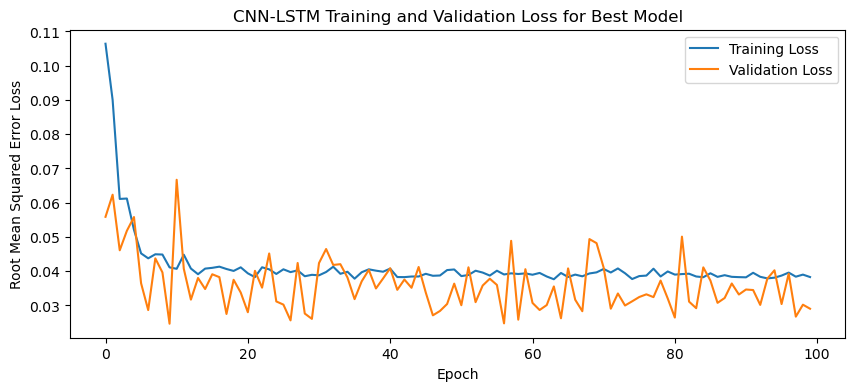

1/1 - 3s - loss: 0.0434 - 3s/epoch - 3s/step
Test Loss: 0.04335951805114746
1/1 [==============================] - 0s 69ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Specific Humidity\tPredicted Specific Humidity\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

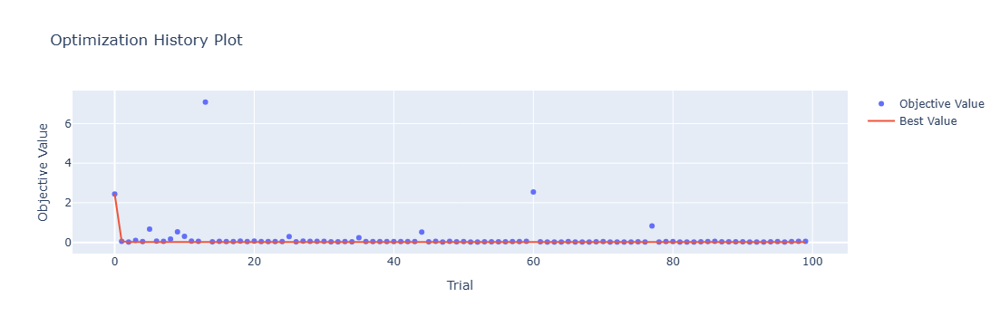

In [4]:
optuna.visualization.plot_optimization_history(study)

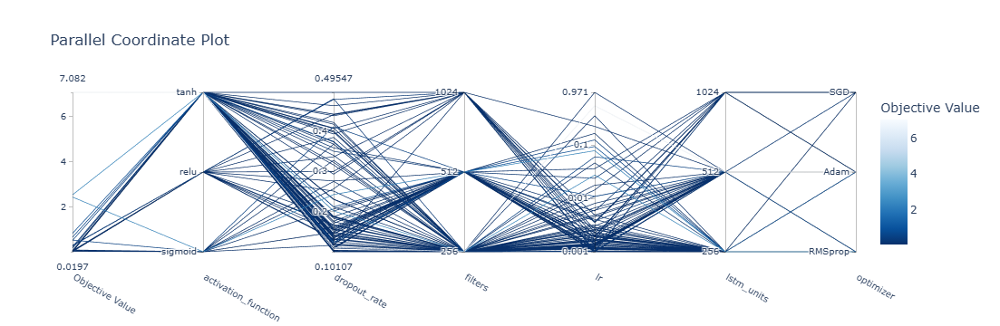

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

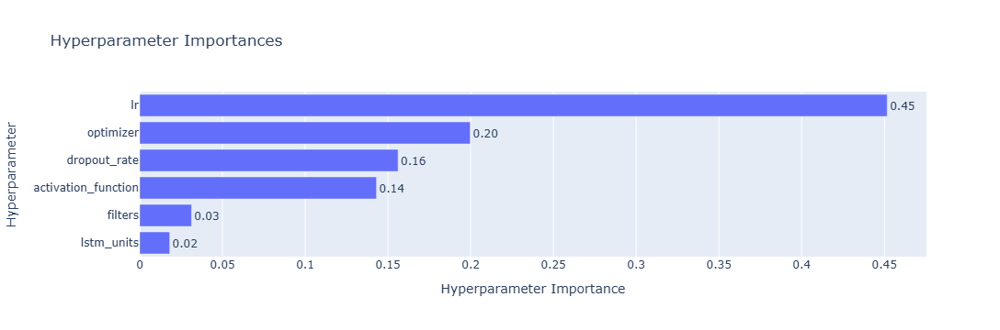

In [6]:
optuna.visualization.plot_param_importances(study)

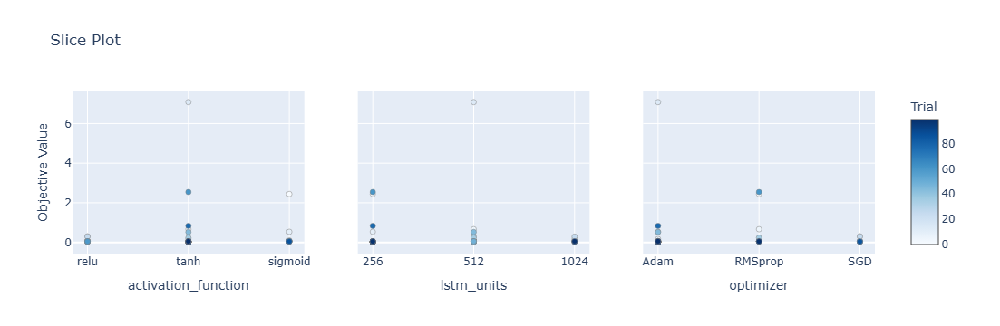

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

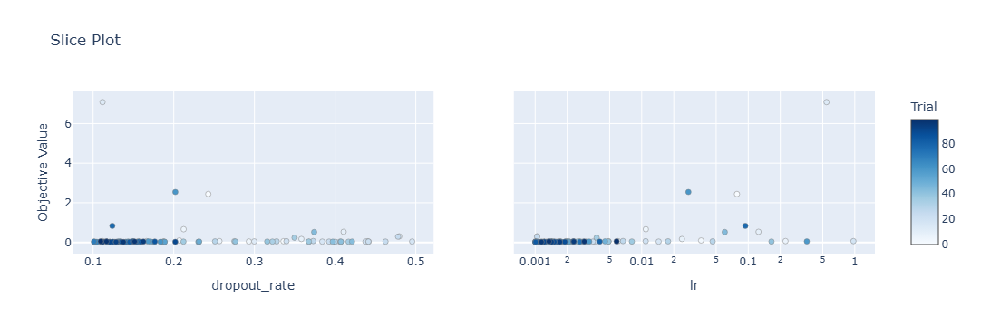

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 8s 41ms/step - loss: 0.1327 - accuracy: 0.5476 - mae: 0.1177 - rmse: 0.1327 - mape: 22.5862 - pearson: 0.6395 - val_loss: 0.0597 - val_accuracy: 0.9000 - val_mae: 0.0509 - val_rmse: 0.0597 - val_mape: 10.0657 - val_pearson: 0.7284
Epoch 2/100
84/84 [==============================] - 1s 15ms/step - loss: 0.0795 - accuracy: 0.7500 - mae: 0.0683 - rmse: 0.0795 - mape: 12.7848 - pearson: 0.6536 - val_loss: 0.0306 - val_accuracy: 0.9000 - val_mae: 0.0275 - val_rmse: 0.0306 - val_mape: 5.3136 - val_pearson: 0.7393
Epoch 3/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0584 - accuracy: 0.8452 - mae: 0.0505 - rmse: 0.0584 - mape: 9.5454 - pearson: 0.8056 - val_loss: 0.0334 - val_accuracy: 0.9000 - val_mae: 0.0266 - val_rmse: 0.0334 - val_mape: 5.1788 - val_pearson: 0.7973
Epoch 4/100
84/84 [==============================] - 2s 26ms/step - loss: 0.0557 - accuracy: 0.8571 - mae: 0.0474 - rmse: 0.0557 - mape: 8.9598 - pears

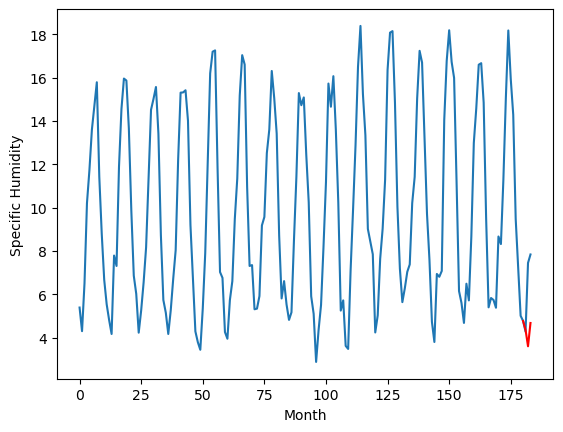

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.05		-0.85
5.61		3.29		-2.32
7.82		4.37		-3.45
[180, 181, 182, 183]
[7.05, 4.0480888962745665, 3.292307126522064, 4.367402064800262]


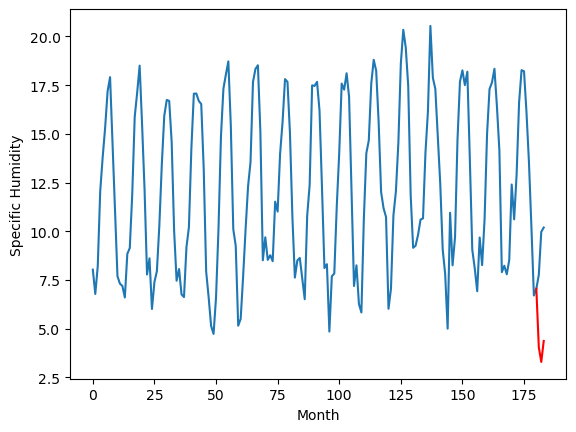

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		3.94		-0.88
4.97		3.18		-1.79
6.82		4.26		-2.56
[180, 181, 182, 183]
[5.06, 3.938088896274567, 3.1823071265220646, 4.257402064800263]


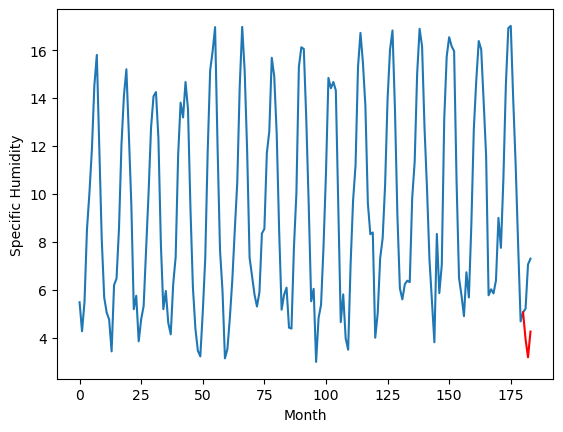

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		3.64		-0.57
4.12		2.88		-1.24
7.57		3.96		-3.61
[180, 181, 182, 183]
[7.05, 3.638088419437408, 2.8823056960105893, 3.957401587963104]


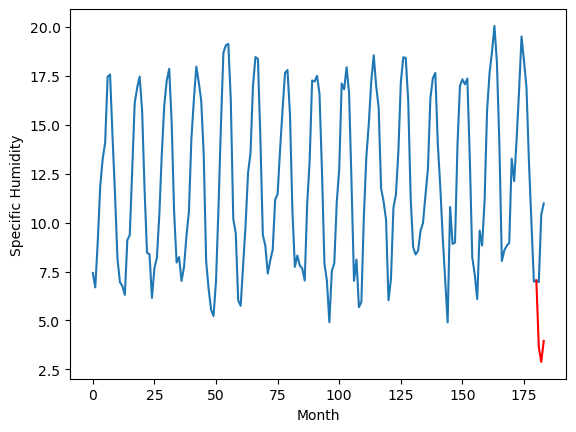

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		4.89		-0.43
4.92		4.13		-0.79
7.76		5.21		-2.55
[180, 181, 182, 183]
[5.2, 4.888088419437408, 4.132305696010589, 5.2074006342887875]


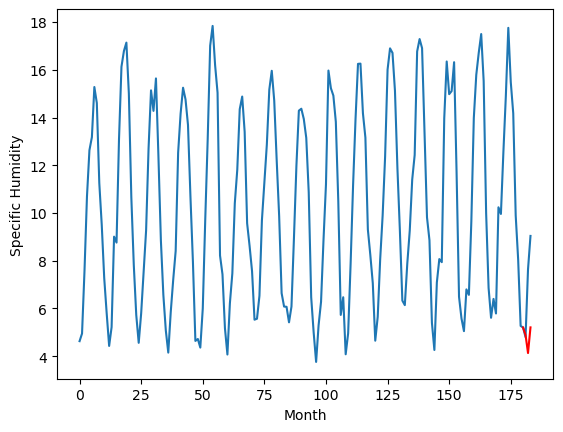

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.53		0.11
8.01		6.77		-1.24
9.58		7.85		-1.73
[180, 181, 182, 183]
[5.16, 7.528088896274566, 6.772307603359222, 7.84740254163742]


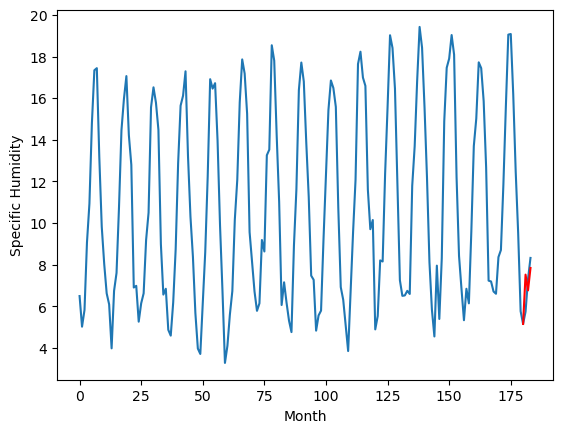

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		4.98		-0.35
5.38		4.22		-1.16
6.97		5.30		-1.67
[180, 181, 182, 183]
[4.05, 4.978088896274567, 4.222307126522065, 5.297402064800263]


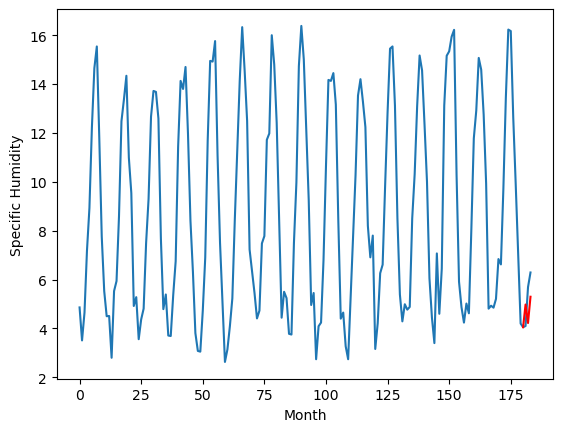

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		6.93		-0.19
7.15		6.17		-0.98
8.77		7.25		-1.52
[180, 181, 182, 183]
[3.64, 6.928088896274566, 6.172307603359222, 7.24740254163742]


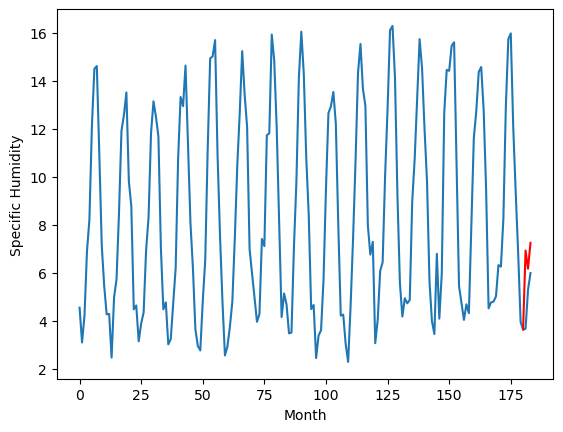

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.13		-0.27
3.72		3.37		-0.35
6.78		4.45		-2.33
[180, 181, 182, 183]
[3.46, 4.128088419437408, 3.3723056960105895, 4.447400634288788]


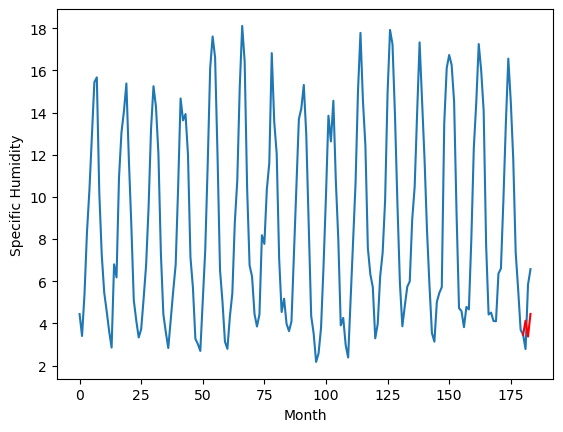

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.00		-0.17
5.72		5.24		-0.48
7.52		6.32		-1.20
[180, 181, 182, 183]
[2.93, 5.998088896274567, 5.242306649684906, 6.317401587963104]


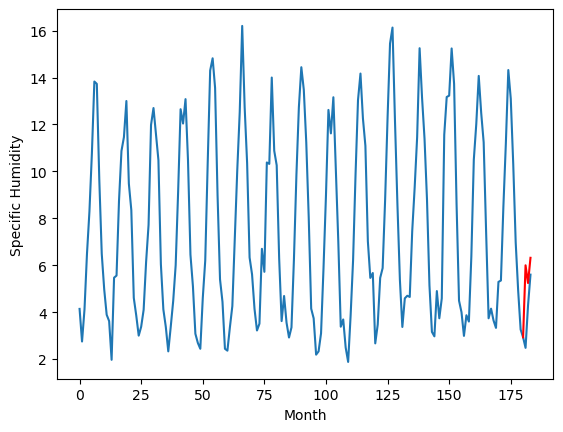

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.36		-0.12
3.74		3.60		-0.14
5.36		4.68		-0.68
[180, 181, 182, 183]
[2.74, 4.358088896274567, 3.6023066496849063, 4.677401587963105]


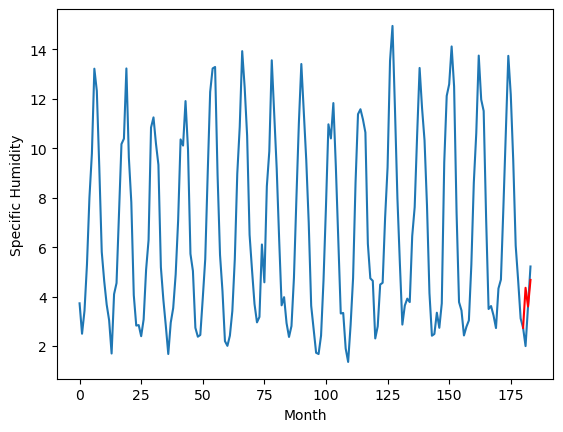

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.358088419437409, 4.0480888962745665, 3.938088896274567, 3.638088419437408, 4.888088419437408, 7.528088896274566, 4.978088896274567, 6.928088896274566, 4.128088419437408, 5.998088896274567, 4.358088896274567]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.358088
1                 1    4.90   4.048089
2                 2    4.82   3.938089
3                 3    4.21   3.638088
4                 4    5.32   4.888088
5                 5    7.42   7.528089
6                 6    5.33   4.978089
7                 7    7.12   6.928089
8                 8    4.40   4.128088
9                 9    6.17   5.998089
10               10    4.48   4.358089


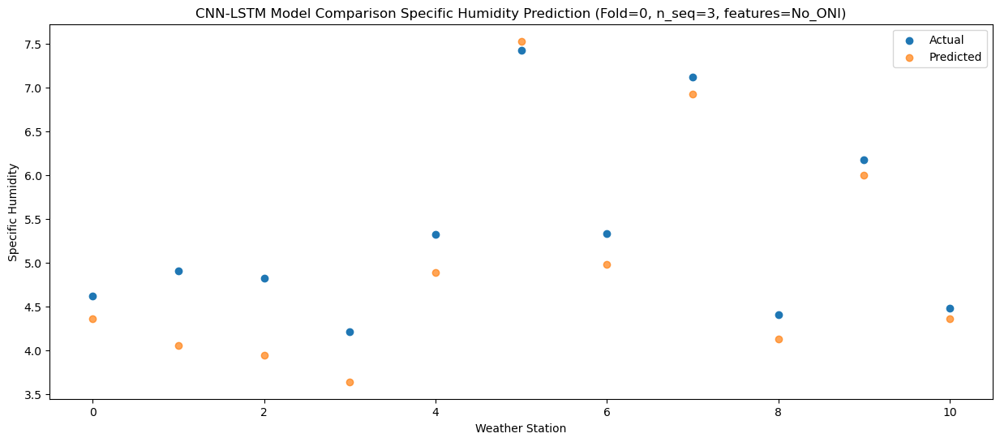

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   3.602306
1                 1    5.61   3.292307
2                 2    4.97   3.182307
3                 3    4.12   2.882306
4                 4    4.92   4.132306
5                 5    8.01   6.772308
6                 6    5.38   4.222307
7                 7    7.15   6.172308
8                 8    3.72   3.372306
9                 9    5.72   5.242307
10               10    3.74   3.602307


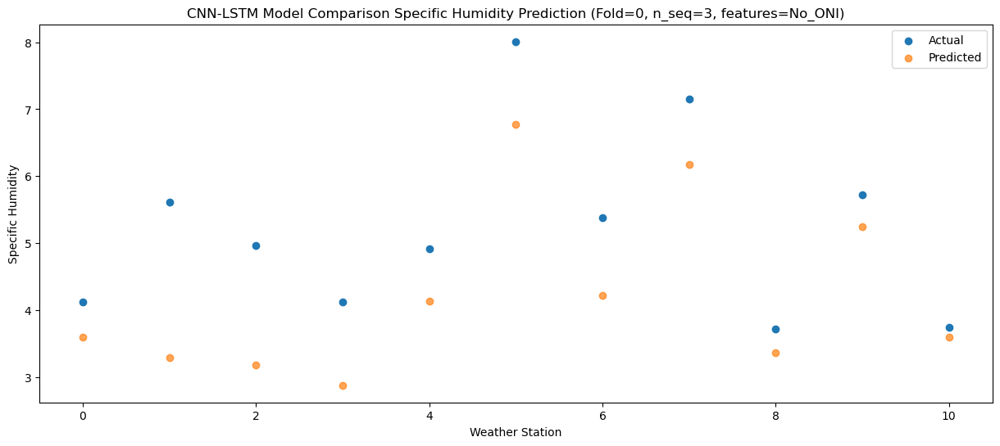

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   4.677401
1                 1    7.82   4.367402
2                 2    6.82   4.257402
3                 3    7.57   3.957402
4                 4    7.76   5.207401
5                 5    9.58   7.847403
6                 6    6.97   5.297402
7                 7    8.77   7.247403
8                 8    6.78   4.447401
9                 9    7.52   6.317402
10               10    5.36   4.677402


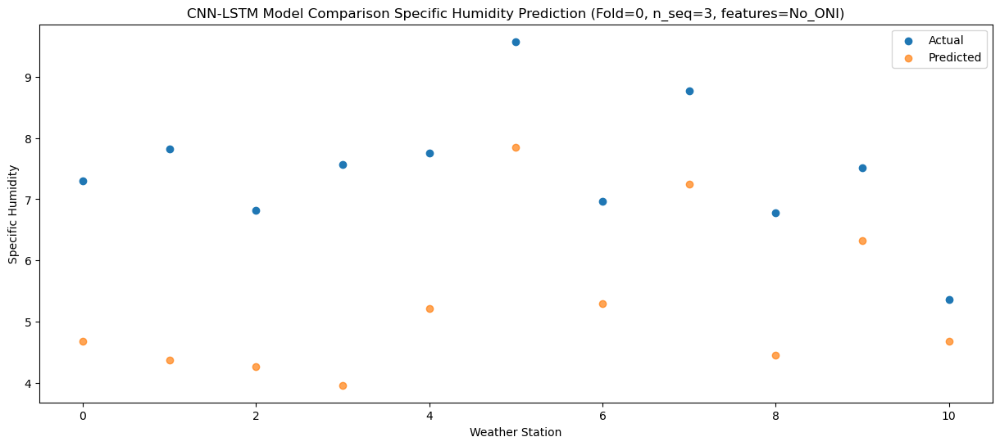

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_15 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_10 (LSTM)              (None, 1, 256)            787456    
                                                                 
 dropout_16 (Dropout)        (None, 1, 256)            0         
                                                                 
 lstm_11 (LSTM)              (None, 256)               525312    
                                                      

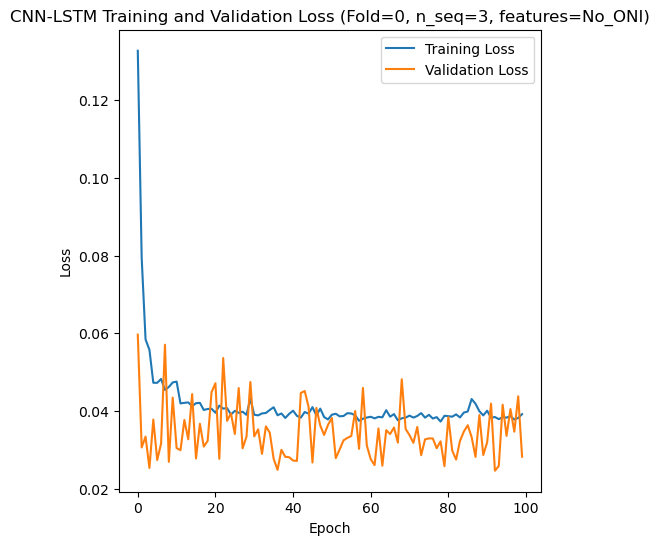

Epoch 1/100
84/84 [==============================] - 44s 265ms/step - loss: 0.1244 - accuracy: 0.6071 - mae: 0.1109 - rmse: 0.1244 - mape: 21.2680 - pearson: 0.5513 - val_loss: 0.0969 - val_accuracy: 0.9000 - val_mae: 0.0827 - val_rmse: 0.0969 - val_mape: 15.5908 - val_pearson: 0.8509
Epoch 2/100
84/84 [==============================] - 14s 169ms/step - loss: 0.0745 - accuracy: 0.8214 - mae: 0.0651 - rmse: 0.0745 - mape: 12.3110 - pearson: 0.7005 - val_loss: 0.0633 - val_accuracy: 0.9000 - val_mae: 0.0509 - val_rmse: 0.0633 - val_mape: 9.6133 - val_pearson: 0.9042
Epoch 3/100
84/84 [==============================] - 14s 172ms/step - loss: 0.0680 - accuracy: 0.8571 - mae: 0.0600 - rmse: 0.0680 - mape: 11.3444 - pearson: 0.7226 - val_loss: 0.0566 - val_accuracy: 0.9000 - val_mae: 0.0499 - val_rmse: 0.0566 - val_mape: 9.5386 - val_pearson: 0.8735
Epoch 4/100
84/84 [==============================] - 14s 170ms/step - loss: 0.0570 - accuracy: 0.8690 - mae: 0.0497 - rmse: 0.0570 - mape: 9.475

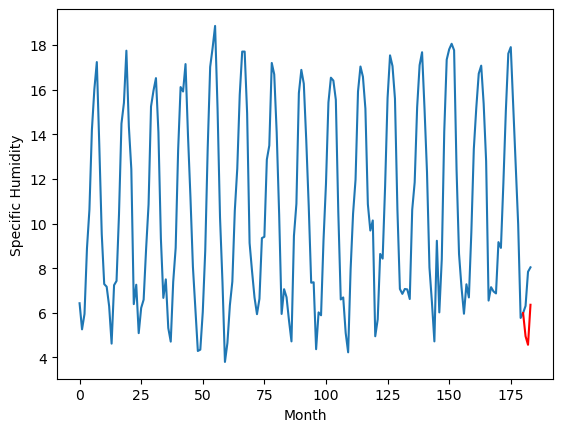

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.46		0.12
4.53		4.08		-0.45
6.06		5.87		-0.19
[180, 181, 182, 183]
[4.15, 4.46101791381836, 4.077486999034882, 5.8716367554664615]


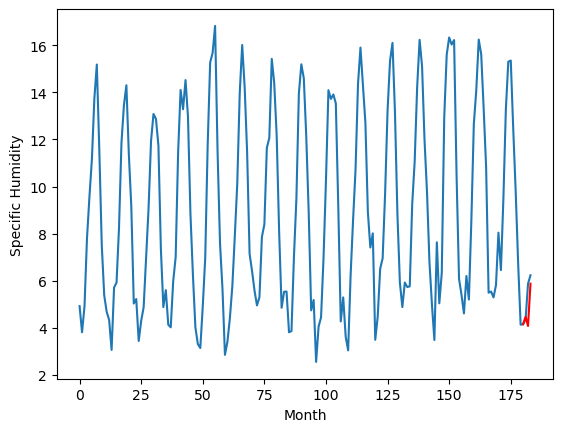

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		3.21		-0.01
3.22		2.83		-0.39
5.84		4.62		-1.22
[180, 181, 182, 183]
[5.12, 3.211017913818359, 2.8274869990348814, 4.6216367554664615]


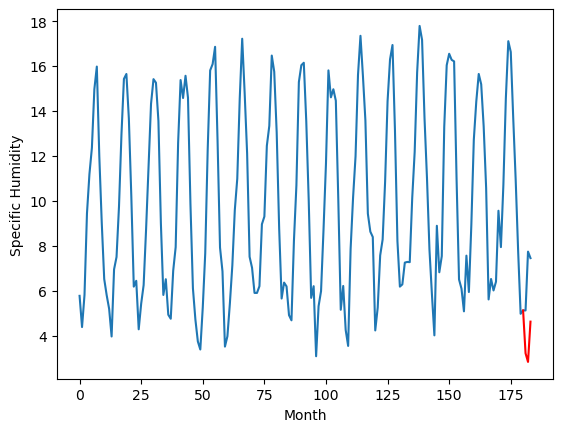

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.51		0.48
2.10		2.13		0.03
4.74		3.92		-0.82
[180, 181, 182, 183]
[6.35, 2.511016945242882, 2.127486030459404, 3.9216357868909837]


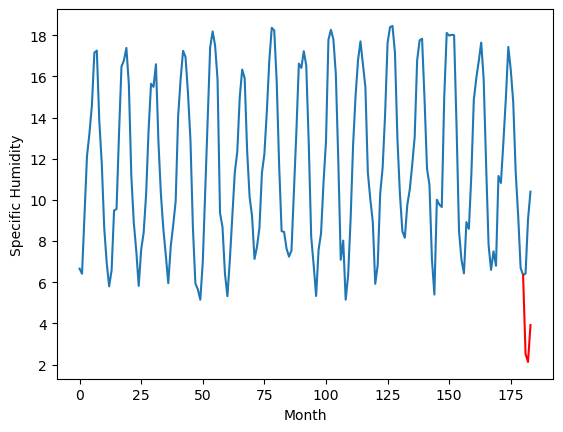

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.57		0.39
6.22		6.19		-0.03
8.94		7.98		-0.96
[180, 181, 182, 183]
[6.08, 6.5710169452428815, 6.187486030459404, 7.981635786890983]


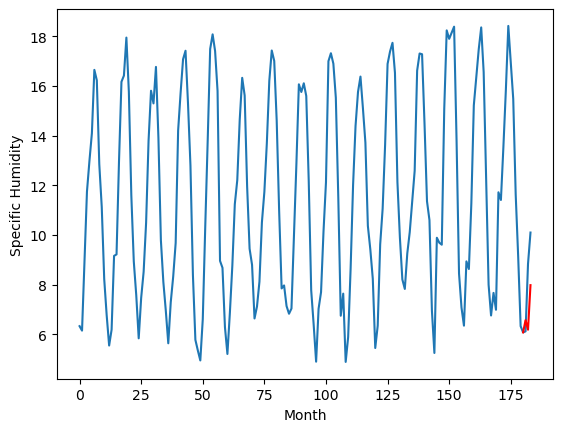

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		5.06		-0.69
5.12		4.68		-0.44
5.91		6.47		0.56
[180, 181, 182, 183]
[3.92, 5.061016945242882, 4.677486030459404, 6.4716357868909835]


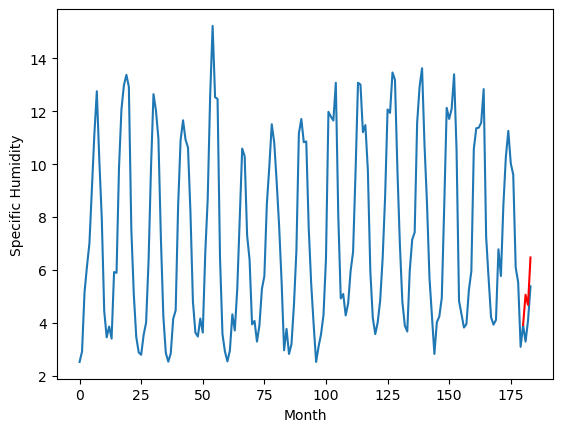

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.91		0.25
5.78		5.53		-0.25
7.34		7.32		-0.02
[180, 181, 182, 183]
[4.16, 5.911017913818359, 5.527486999034881, 7.321636755466461]


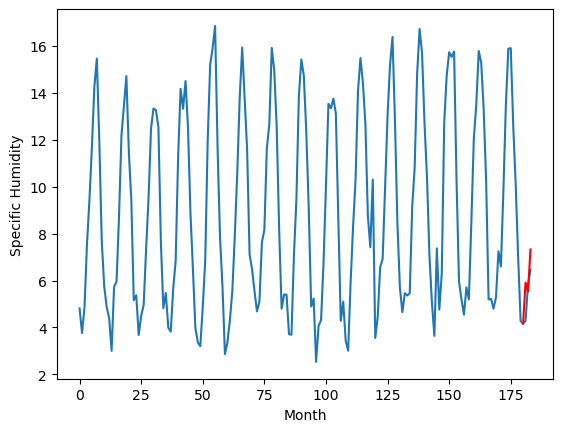

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.80		0.27
6.01		6.42		0.41
8.74		8.21		-0.53
[180, 181, 182, 183]
[3.84, 6.801016945242882, 6.417486030459404, 8.211635786890984]


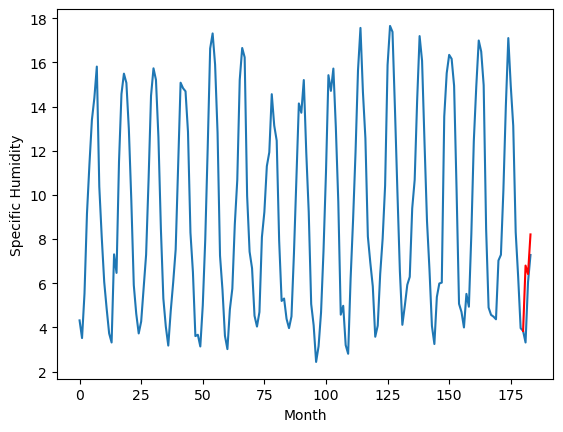

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.47		-0.02
5.68		6.09		0.41
8.29		7.88		-0.41
[180, 181, 182, 183]
[3.73, 6.471016945242882, 6.087486030459404, 7.881635786890984]


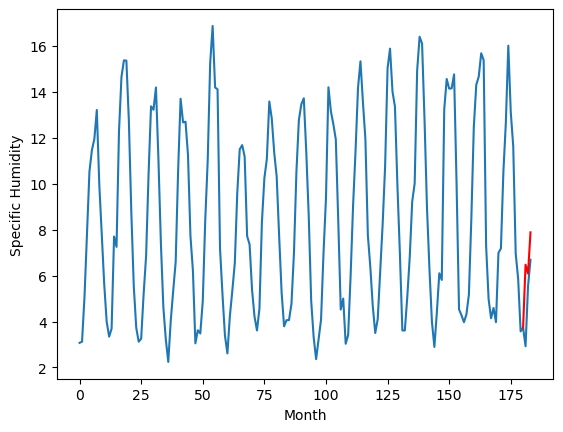

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.66		-0.05
1.97		2.28		0.31
3.79		4.07		0.28
[180, 181, 182, 183]
[2.83, 2.661016945242882, 2.277486030459404, 4.071635786890983]


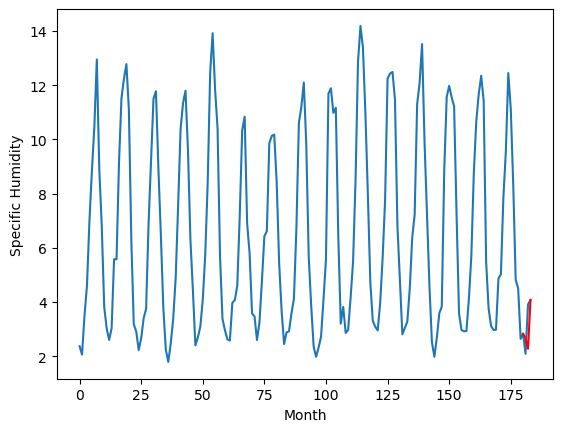

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.95		0.87
4.12		4.57		0.45
5.36		6.36		1.00
[180, 181, 182, 183]
[2.69, 4.951016945242881, 4.567486030459404, 6.361636859774589]


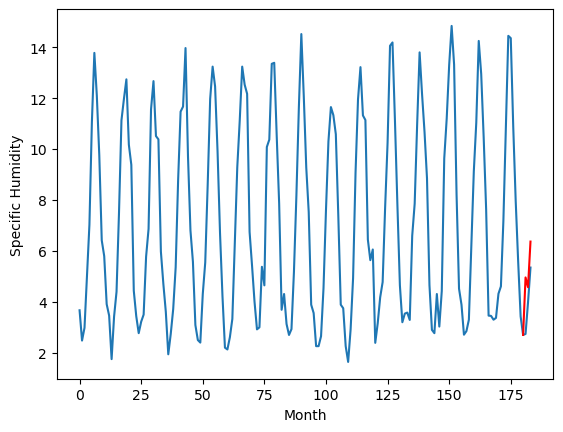

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.951017913818359, 4.46101791381836, 3.211017913818359, 2.511016945242882, 6.5710169452428815, 5.061016945242882, 5.911017913818359, 6.801016945242882, 6.471016945242882, 2.661016945242882, 4.951016945242881]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.951018
1                 1    4.34   4.461018
2                 2    3.22   3.211018
3                 3    2.03   2.511017
4                 4    6.18   6.571017
5                 5    5.75   5.061017
6                 6    5.66   5.911018
7                 7    6.53   6.801017
8                 8    6.49   6.471017
9                 9    2.71   2.661017
10               10    4.08   4.951017


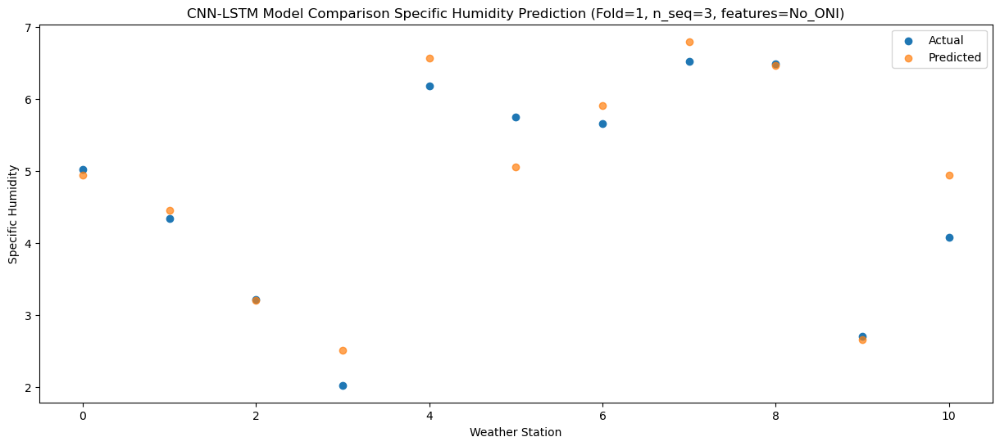

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.567487
1                 1    4.53   4.077487
2                 2    3.22   2.827487
3                 3    2.10   2.127486
4                 4    6.22   6.187486
5                 5    5.12   4.677486
6                 6    5.78   5.527487
7                 7    6.01   6.417486
8                 8    5.68   6.087486
9                 9    1.97   2.277486
10               10    4.12   4.567486


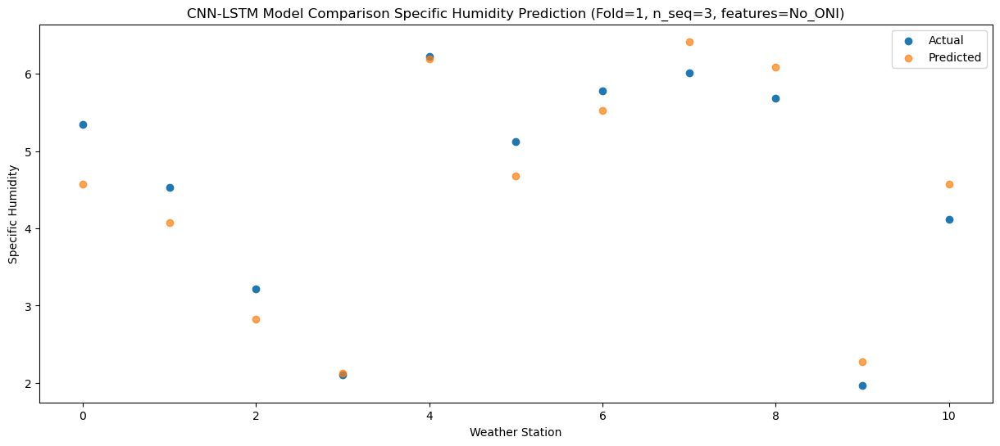

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.361638
1                 1    6.06   5.871637
2                 2    5.84   4.621637
3                 3    4.74   3.921636
4                 4    8.94   7.981636
5                 5    5.91   6.471636
6                 6    7.34   7.321637
7                 7    8.74   8.211636
8                 8    8.29   7.881636
9                 9    3.79   4.071636
10               10    5.36   6.361637


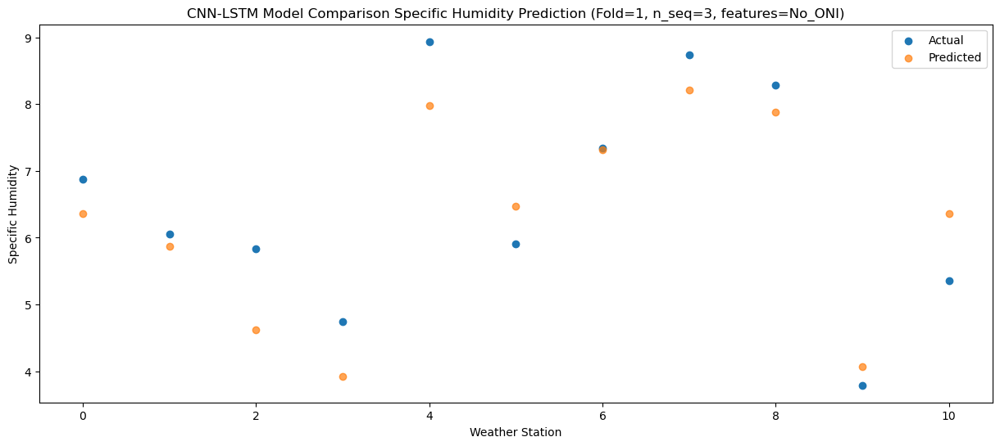

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_18 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_12 (LSTM)              (None, 1, 256)            787456    
                                                                 
 dropout_19 (Dropout)        (None, 1, 256)            0         
                                                                 
 lstm_13 (LSTM)              (None, 256)               525312    
                                                      

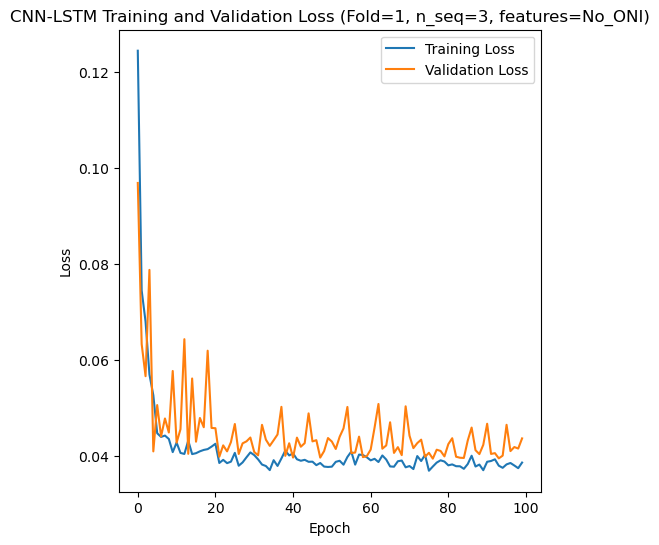

Epoch 1/100
84/84 [==============================] - 46s 245ms/step - loss: 0.1122 - accuracy: 0.7262 - mae: 0.1023 - rmse: 0.1122 - mape: 19.4439 - pearson: 0.6240 - val_loss: 0.0644 - val_accuracy: 1.0000 - val_mae: 0.0608 - val_rmse: 0.0644 - val_mape: 12.0746 - val_pearson: 0.7044
Epoch 2/100
84/84 [==============================] - 14s 168ms/step - loss: 0.0820 - accuracy: 0.7857 - mae: 0.0706 - rmse: 0.0820 - mape: 13.2272 - pearson: 0.6428 - val_loss: 0.0856 - val_accuracy: 0.0000e+00 - val_mae: 0.0627 - val_rmse: 0.0856 - val_mape: 10.8806 - val_pearson: 0.2063
Epoch 3/100
84/84 [==============================] - 14s 167ms/step - loss: 0.0688 - accuracy: 0.8095 - mae: 0.0582 - rmse: 0.0688 - mape: 11.1056 - pearson: 0.6535 - val_loss: 0.0324 - val_accuracy: 1.0000 - val_mae: 0.0269 - val_rmse: 0.0324 - val_mape: 5.0157 - val_pearson: 0.8843
Epoch 4/100
84/84 [==============================] - 14s 168ms/step - loss: 0.0565 - accuracy: 0.7857 - mae: 0.0487 - rmse: 0.0565 - mape: 

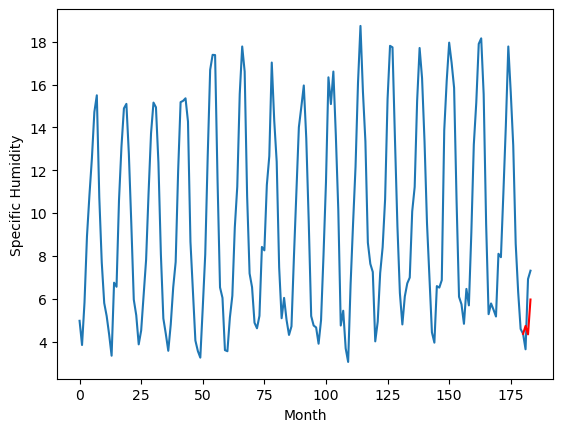

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		2.00		0.16
1.16		1.61		0.45
3.01		3.23		0.22
[180, 181, 182, 183]
[2.82, 2.0027773001790043, 1.6064408937096593, 3.233669511377811]


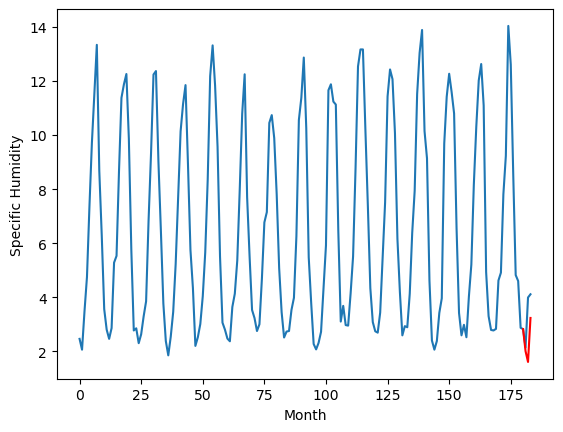

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		5.15		-0.38
7.66		4.76		-2.90
7.88		6.38		-1.50
[180, 181, 182, 183]
[9.16, 5.152778253853321, 4.756442801058292, 6.383671418726444]


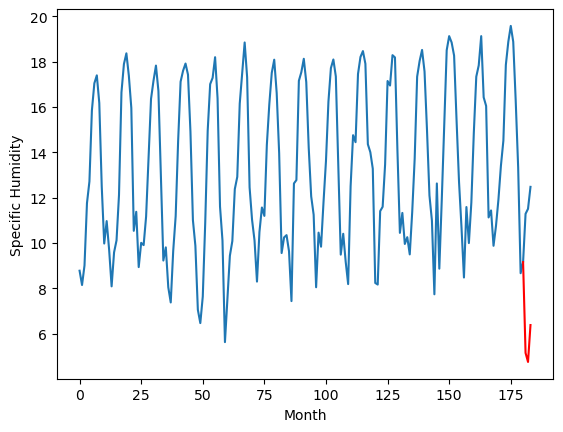

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		5.17		1.19
4.15		4.78		0.63
4.79		6.40		1.61
[180, 181, 182, 183]
[2.44, 5.172778253853321, 4.776441847383976, 6.4036704650521274]


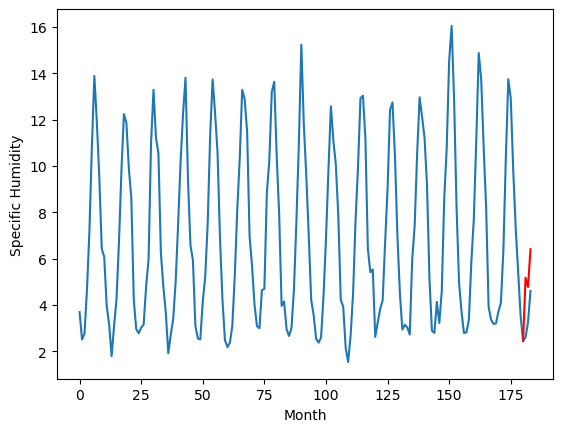

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		5.08		-0.02
5.08		4.69		-0.39
8.37		6.31		-2.06
[180, 181, 182, 183]
[6.65, 5.082779214978218, 4.686444239020347, 6.313674764037132]


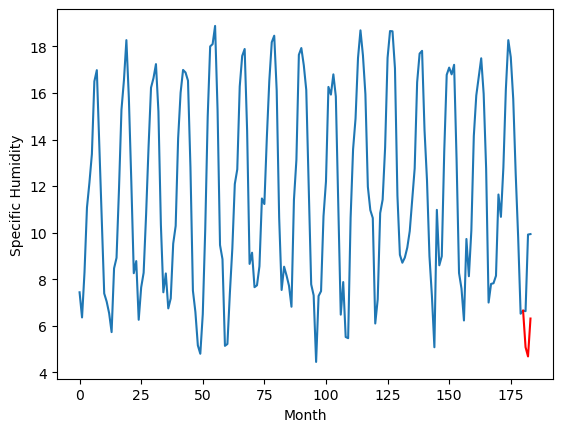

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.57		0.24
2.28		2.18		-0.10
5.27		3.80		-1.47
[180, 181, 182, 183]
[6.19, 2.5727773001790046, 2.1764413705468177, 3.8036699882149696]


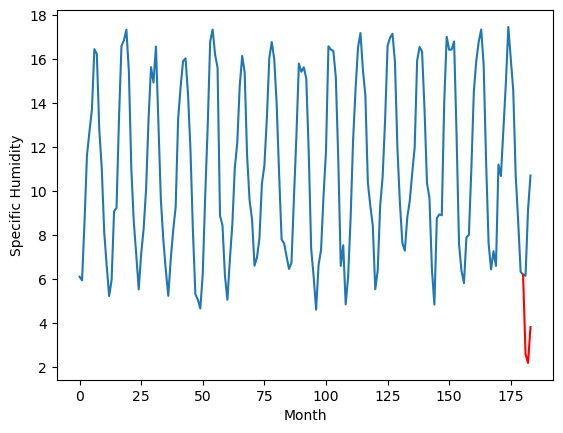

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.89		0.21
8.35		8.50		0.15
11.21		10.12		-1.09
[180, 181, 182, 183]
[4.78, 8.89277825385332, 8.496442324221134, 10.123671895563602]


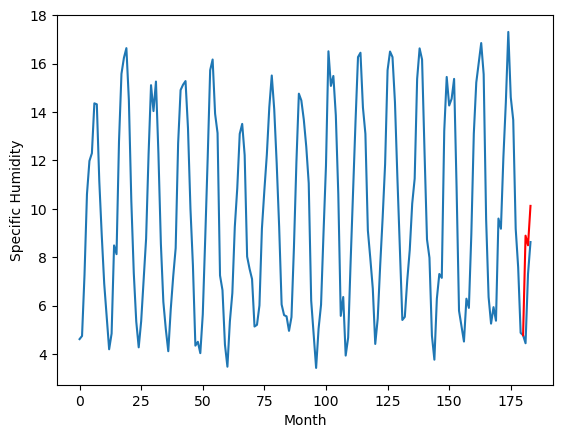

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.80		-0.17
3.84		3.41		-0.43
3.93		5.03		1.10
[180, 181, 182, 183]
[2.61, 3.802778253853321, 3.406442324221134, 5.0336709418892855]


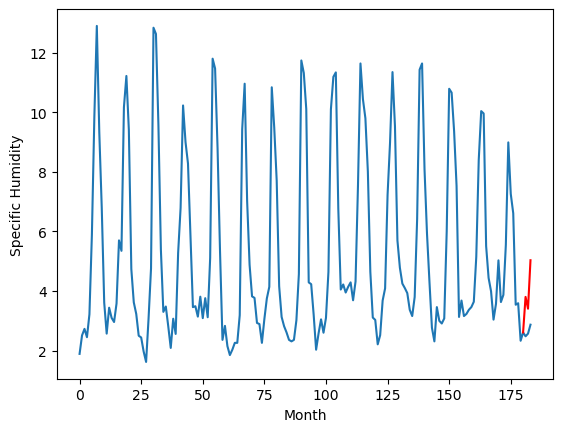

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.55		-0.74
8.82		7.16		-1.66
8.93		8.78		-0.15
[180, 181, 182, 183]
[4.6, 7.5527782538533215, 7.156442801058293, 8.783671418726446]


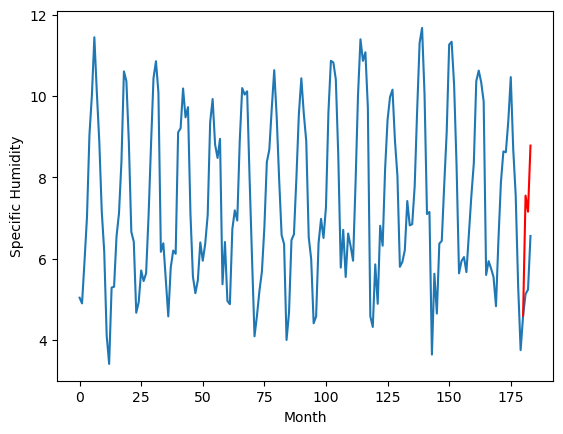

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		6.21		0.23
6.05		5.82		-0.23
7.78		7.44		-0.34
[180, 181, 182, 183]
[4.27, 6.212779214978218, 5.816443285346031, 7.443672856688499]


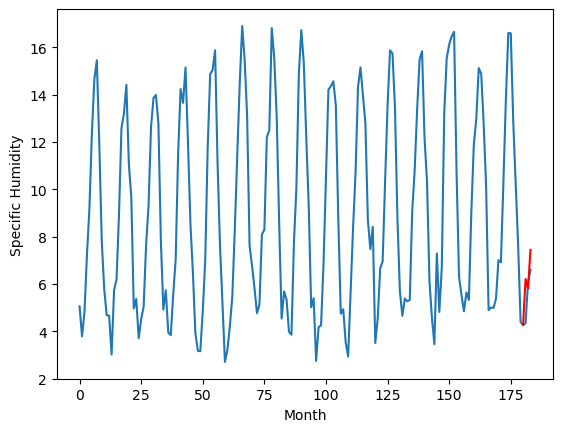

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.73		0.10
4.87		4.34		-0.53
5.90		5.96		0.06
[180, 181, 182, 183]
[3.91, 4.732778253853321, 4.336443754732609, 5.963673326075077]


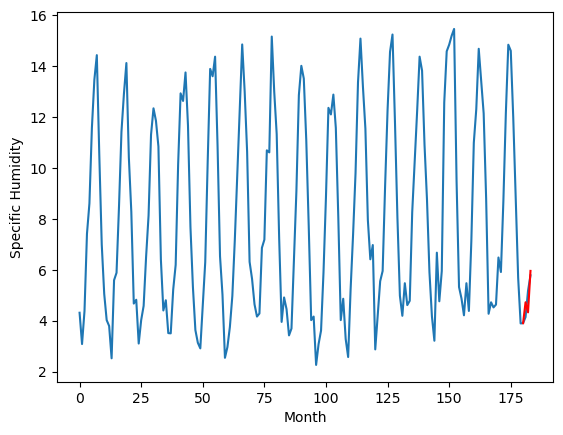

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.732778253853321, 2.0027773001790043, 5.152778253853321, 5.172778253853321, 5.082779214978218, 2.5727773001790046, 8.89277825385332, 3.802778253853321, 7.5527782538533215, 6.212779214978218, 4.732778253853321]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.732778
1                 1    1.84   2.002777
2                 2    5.53   5.152778
3                 3    3.98   5.172778
4                 4    5.10   5.082779
5                 5    2.33   2.572777
6                 6    8.68   8.892778
7                 7    3.97   3.802778
8                 8    8.29   7.552778
9                 9    5.98   6.212779
10               10    4.63   4.732778


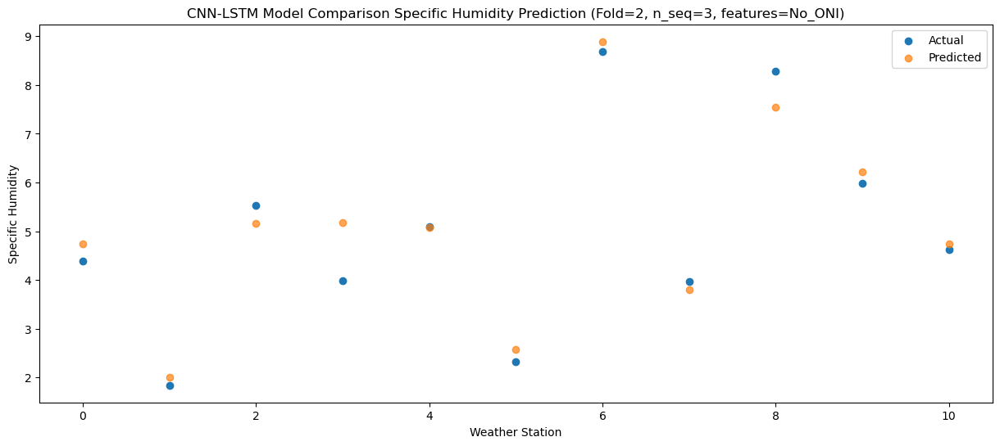

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.336442
1                 1    1.16   1.606441
2                 2    7.66   4.756443
3                 3    4.15   4.776442
4                 4    5.08   4.686444
5                 5    2.28   2.176441
6                 6    8.35   8.496442
7                 7    3.84   3.406442
8                 8    8.82   7.156443
9                 9    6.05   5.816443
10               10    4.87   4.336444


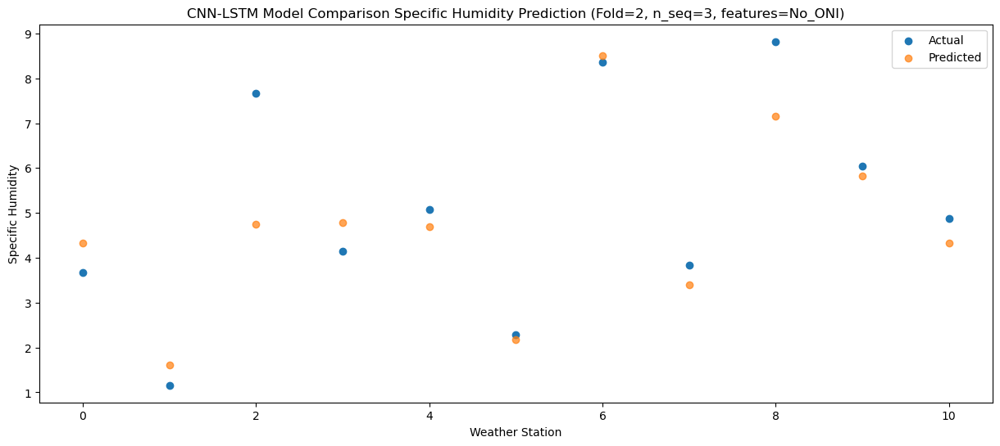

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   5.963671
1                 1    3.01   3.233670
2                 2    7.88   6.383671
3                 3    4.79   6.403670
4                 4    8.37   6.313675
5                 5    5.27   3.803670
6                 6   11.21  10.123672
7                 7    3.93   5.033671
8                 8    8.93   8.783671
9                 9    7.78   7.443673
10               10    5.90   5.963673


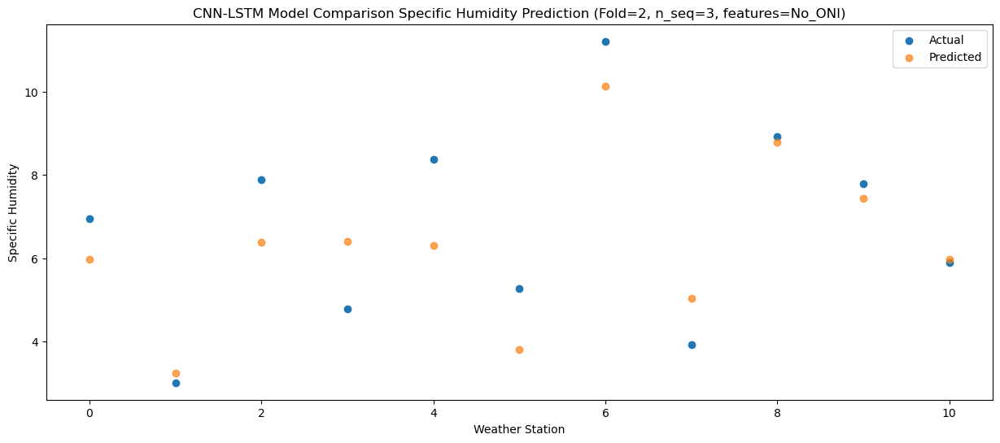

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_21 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_14 (LSTM)              (None, 1, 256)            787456    
                                                                 
 dropout_22 (Dropout)        (None, 1, 256)            0         
                                                                 
 lstm_15 (LSTM)              (None, 256)               525312    
                                                      

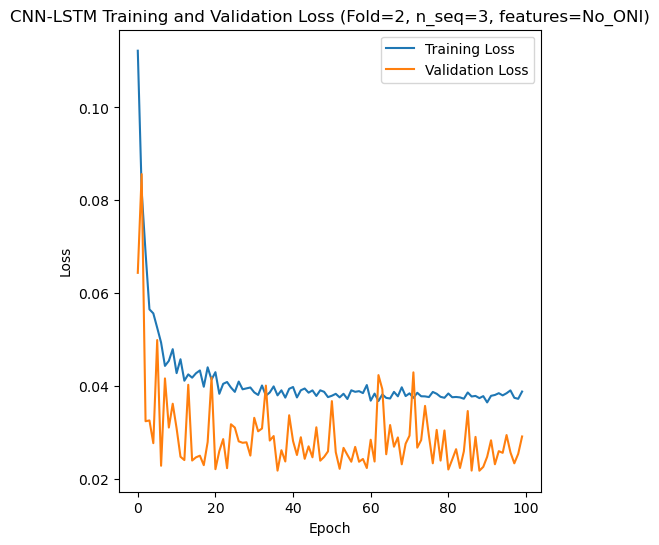

Epoch 1/100
84/84 [==============================] - 44s 250ms/step - loss: 0.1121 - accuracy: 0.6429 - mae: 0.1021 - rmse: 0.1121 - mape: 19.5497 - pearson: 0.6237 - val_loss: 0.1106 - val_accuracy: 0.8000 - val_mae: 0.0807 - val_rmse: 0.1106 - val_mape: 14.9031 - val_pearson: 0.8470
Epoch 2/100
84/84 [==============================] - 14s 164ms/step - loss: 0.0827 - accuracy: 0.7976 - mae: 0.0709 - rmse: 0.0827 - mape: 13.3494 - pearson: 0.6950 - val_loss: 0.0308 - val_accuracy: 0.8000 - val_mae: 0.0267 - val_rmse: 0.0308 - val_mape: 5.1445 - val_pearson: 0.8262
Epoch 3/100
84/84 [==============================] - 14s 162ms/step - loss: 0.0620 - accuracy: 0.8571 - mae: 0.0536 - rmse: 0.0620 - mape: 10.0739 - pearson: 0.7518 - val_loss: 0.0486 - val_accuracy: 0.8000 - val_mae: 0.0388 - val_rmse: 0.0486 - val_mape: 7.9406 - val_pearson: 0.7337
Epoch 4/100
84/84 [==============================] - 14s 163ms/step - loss: 0.0634 - accuracy: 0.8095 - mae: 0.0544 - rmse: 0.0634 - mape: 10.24

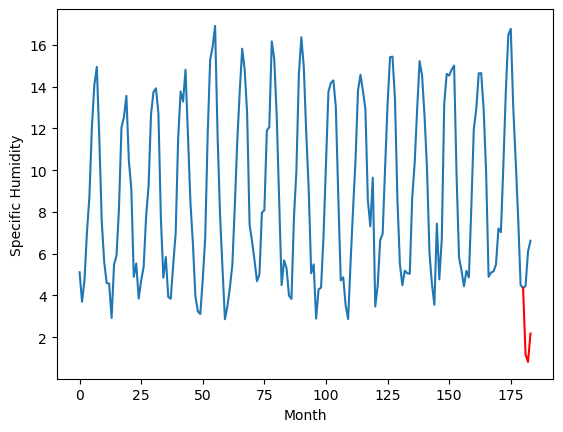

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.20		-0.44
2.08		1.86		-0.22
4.59		3.21		-1.38
[180, 181, 182, 183]
[3.43, 2.2038451838493347, 1.85531778216362, 3.2136862981319427]


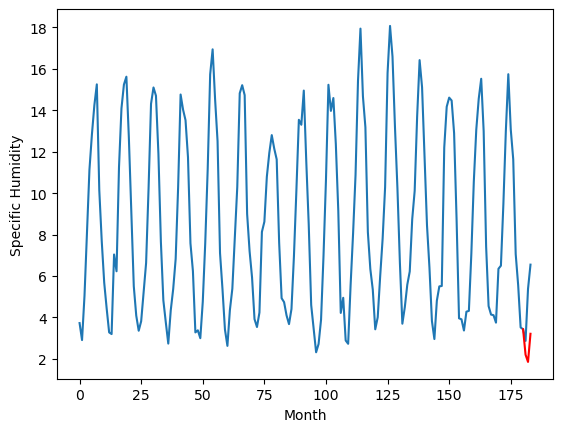

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.40		-0.97
6.31		5.06		-1.25
6.39		6.41		0.02
[180, 181, 182, 183]
[5.43, 5.403848581314087, 5.05532165646553, 6.413692079782486]


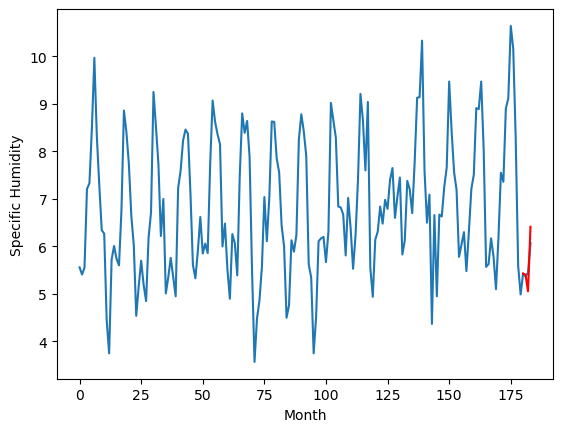

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.18		-0.26
3.37		2.84		-0.53
4.67		4.19		-0.48
[180, 181, 182, 183]
[3.21, 3.183846197128296, 2.8353212094306945, 4.193687698841095]


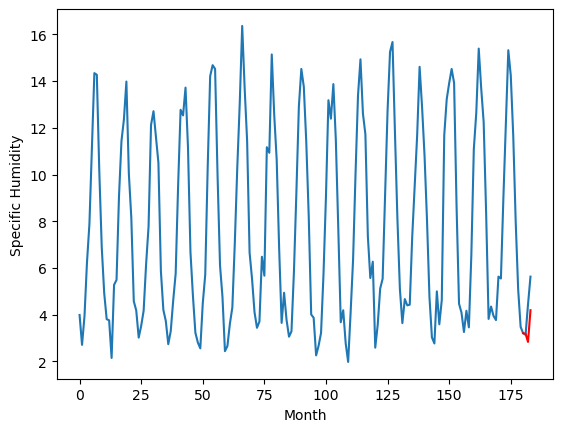

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.58		-0.33
4.08		4.24		0.16
6.56		5.59		-0.97
[180, 181, 182, 183]
[3.04, 4.583846673965454, 4.235320702791214, 5.593689218759537]


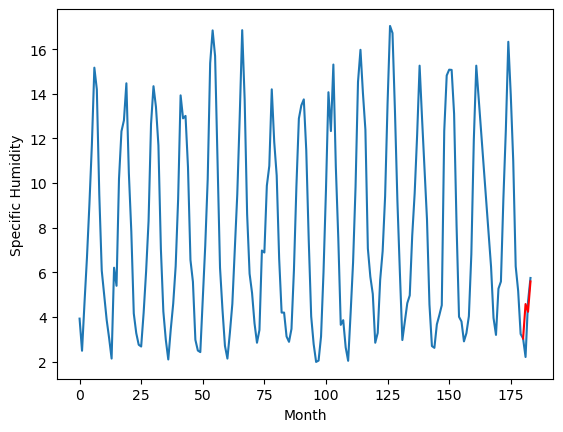

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.20		-0.22
2.90		2.86		-0.04
4.93		4.21		-0.72
[180, 181, 182, 183]
[2.91, 3.203846197128296, 2.8553202259540558, 4.213687788248063]


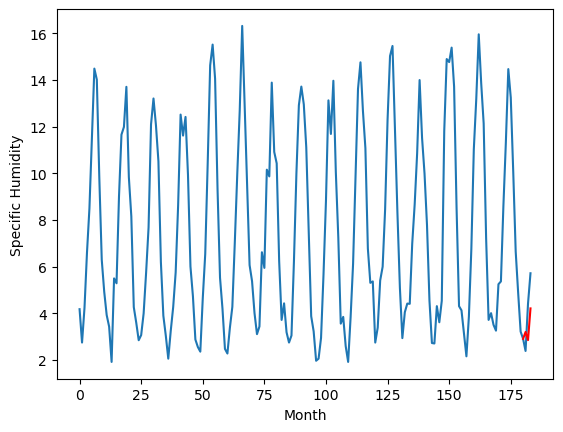

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.03		-0.70
5.79		4.69		-1.10
6.10		6.04		-0.06
[180, 181, 182, 183]
[1.6, 5.033846673965454, 4.685319749116897, 6.04368826508522]


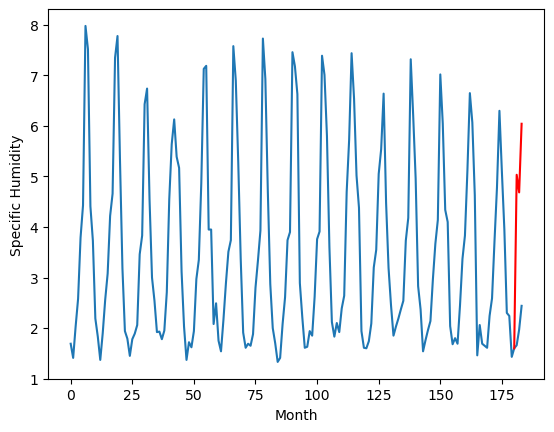

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.46		-1.34
4.32		3.12		-1.20
4.62		4.47		-0.15
[180, 181, 182, 183]
[2.86, 3.4638471508026125, 3.115320225954056, 4.473688741922379]


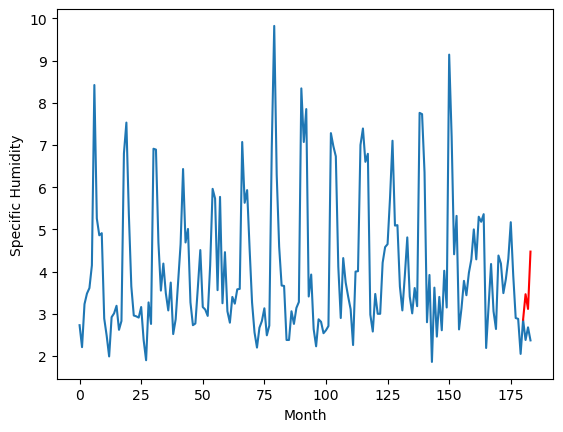

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.40		-1.20
4.25		3.06		-1.19
3.90		4.41		0.51
[180, 181, 182, 183]
[5.65, 3.403848581314087, 3.0553216564655306, 4.413691126108169]


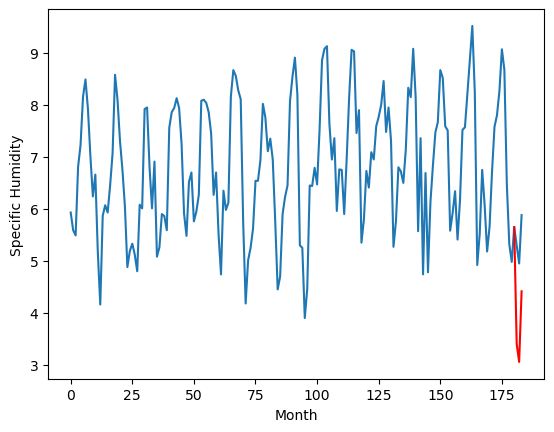

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.65		0.56
3.24		3.31		0.07
4.02		4.66		0.64
[180, 181, 182, 183]
[2.54, 3.653847150802612, 3.3053216862678525, 4.663689248561859]


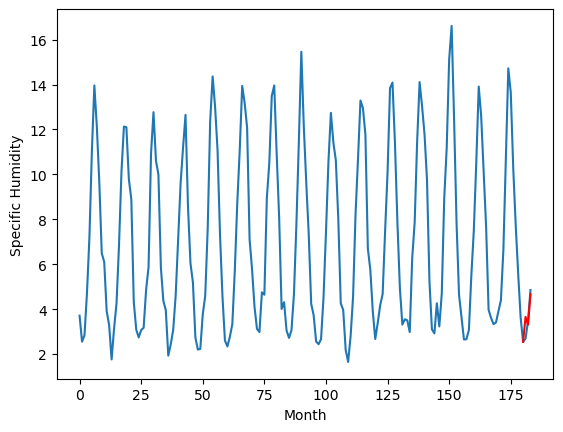

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.16		0.16
0.86		0.82		-0.04
2.14		2.17		0.03
[180, 181, 182, 183]
[2.51, 1.1638471508026123, 0.8153216862678527, 2.1736902022361755]


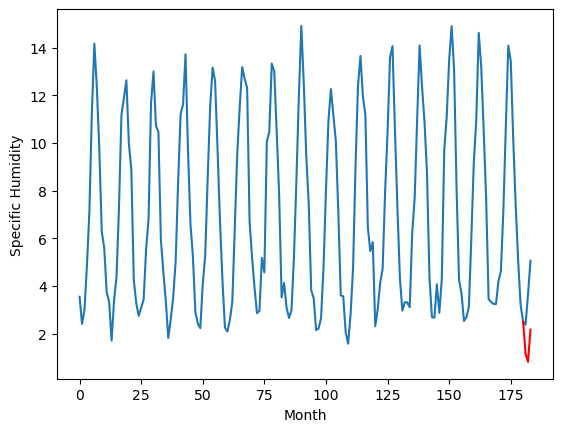

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.1638447070121765, 2.2038451838493347, 5.403848581314087, 3.183846197128296, 4.583846673965454, 3.203846197128296, 5.033846673965454, 3.4638471508026125, 3.403848581314087, 3.653847150802612, 1.1638471508026123]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.163845
1                 1    2.64   2.203845
2                 2    6.37   5.403849
3                 3    3.44   3.183846
4                 4    4.91   4.583847
5                 5    3.42   3.203846
6                 6    5.73   5.033847
7                 7    4.80   3.463847
8                 8    4.60   3.403849
9                 9    3.09   3.653847
10               10    1.00   1.163847


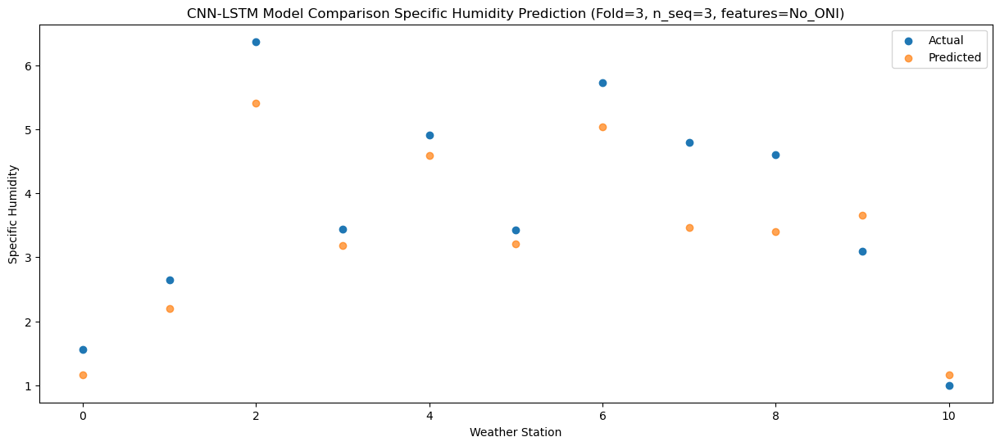

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   0.815317
1                 1    2.08   1.855318
2                 2    6.31   5.055322
3                 3    3.37   2.835321
4                 4    4.08   4.235321
5                 5    2.90   2.855320
6                 6    5.79   4.685320
7                 7    4.32   3.115320
8                 8    4.25   3.055322
9                 9    3.24   3.305322
10               10    0.86   0.815322


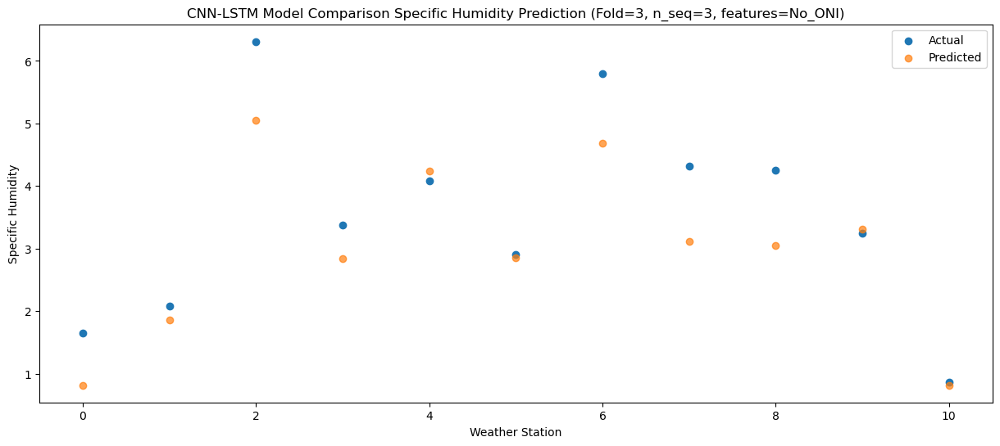

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   2.173681
1                 1    4.59   3.213686
2                 2    6.39   6.413692
3                 3    4.67   4.193688
4                 4    6.56   5.593689
5                 5    4.93   4.213688
6                 6    6.10   6.043688
7                 7    4.62   4.473689
8                 8    3.90   4.413691
9                 9    4.02   4.663689
10               10    2.14   2.173690


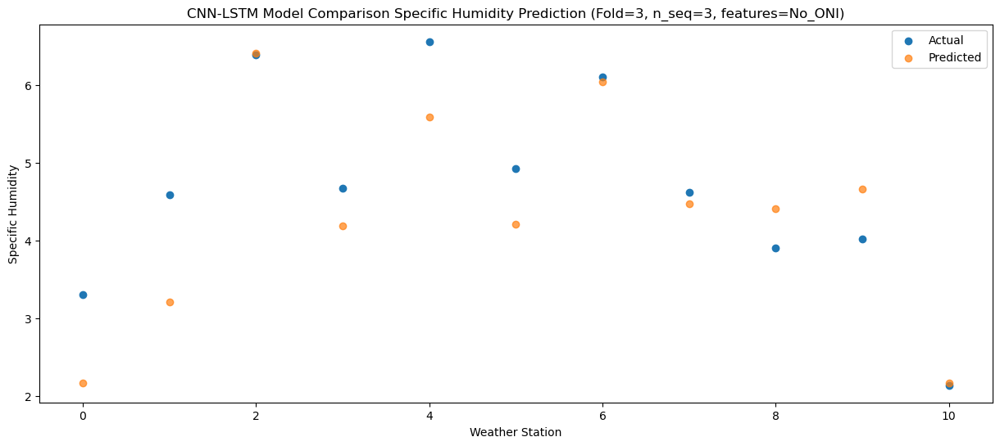

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_24 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_16 (LSTM)              (None, 1, 256)            787456    
                                                                 
 dropout_25 (Dropout)        (None, 1, 256)            0         
                                                                 
 lstm_17 (LSTM)              (None, 256)               525312    
                                                      

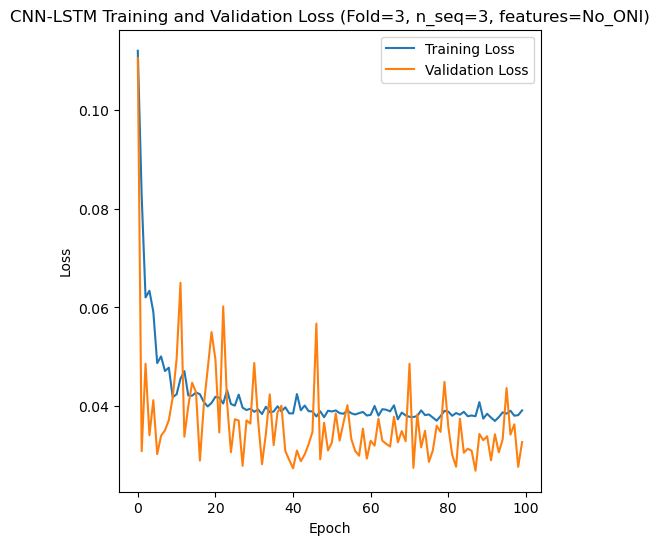

Epoch 1/100
84/84 [==============================] - 43s 248ms/step - loss: 0.1203 - accuracy: 0.5952 - mae: 0.1061 - rmse: 0.1203 - mape: 20.1892 - pearson: 0.6504 - val_loss: 0.1082 - val_accuracy: 0.9000 - val_mae: 0.1017 - val_rmse: 0.1082 - val_mape: 19.8209 - val_pearson: 0.6927
Epoch 2/100
84/84 [==============================] - 14s 163ms/step - loss: 0.0870 - accuracy: 0.7738 - mae: 0.0792 - rmse: 0.0870 - mape: 15.0342 - pearson: 0.6756 - val_loss: 0.0455 - val_accuracy: 0.9000 - val_mae: 0.0403 - val_rmse: 0.0455 - val_mape: 8.0330 - val_pearson: 0.7453
Epoch 3/100
84/84 [==============================] - 14s 163ms/step - loss: 0.0708 - accuracy: 0.8214 - mae: 0.0627 - rmse: 0.0708 - mape: 12.0016 - pearson: 0.7812 - val_loss: 0.0423 - val_accuracy: 0.9000 - val_mae: 0.0388 - val_rmse: 0.0423 - val_mape: 7.3582 - val_pearson: 0.6570
Epoch 4/100
84/84 [==============================] - 14s 163ms/step - loss: 0.0617 - accuracy: 0.8214 - mae: 0.0535 - rmse: 0.0617 - mape: 10.05

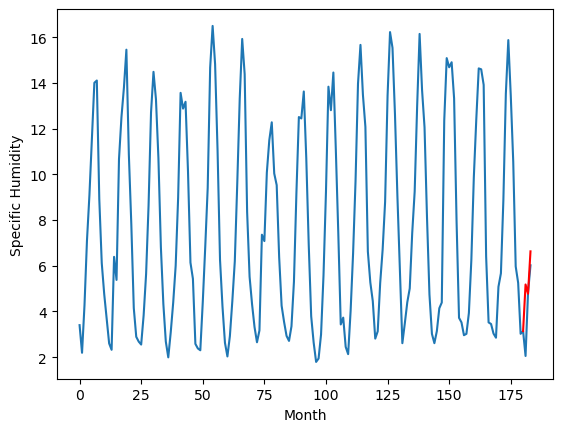

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.88		-0.39
6.26		3.48		-2.78
6.23		5.33		-0.90
[180, 181, 182, 183]
[7.79, 3.8798748348653316, 3.475976625531912, 5.330381432622671]


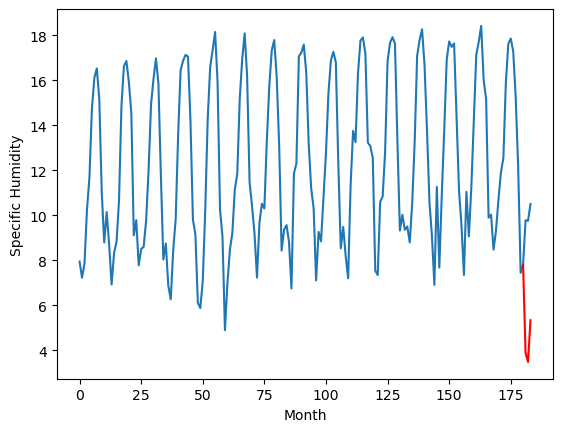

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.94		0.07
3.75		3.54		-0.21
6.81		5.39		-1.42
[180, 181, 182, 183]
[5.03, 3.939879670292139, 3.535984828621149, 5.390391543060542]


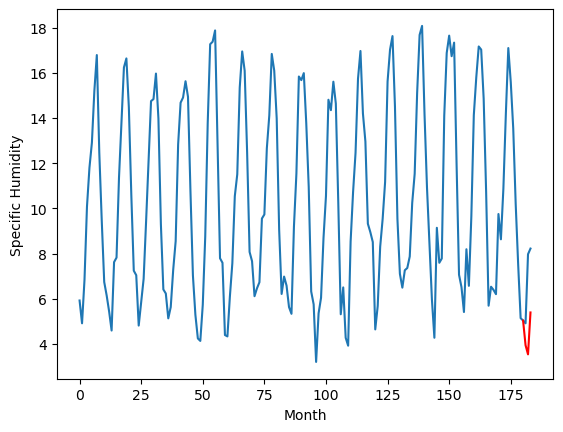

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.80		0.07
3.41		3.40		-0.01
6.07		5.25		-0.82
[180, 181, 182, 183]
[4.41, 3.799878221154213, 3.3959809654951094, 5.250388633608818]


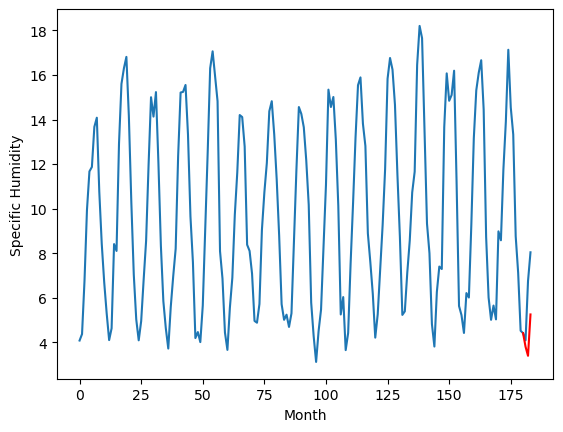

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.36		-0.00
2.91		2.96		0.05
5.49		4.81		-0.68
[180, 181, 182, 183]
[4.29, 3.359876287728548, 2.955978078395128, 4.810383839160204]


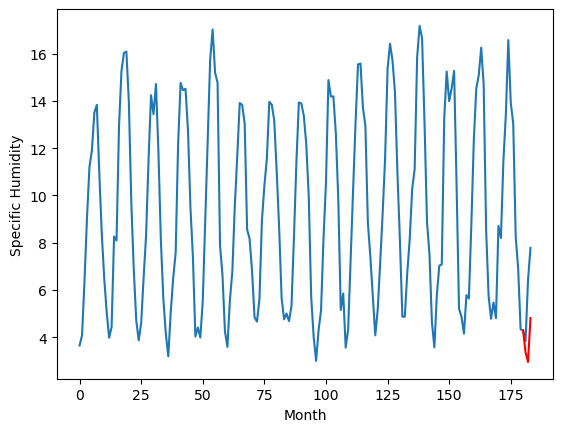

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.90		-0.74
8.00		7.50		-0.50
9.49		9.35		-0.14
[180, 181, 182, 183]
[3.47, 7.899866616874934, 7.495958721786738, 9.350359714180232]


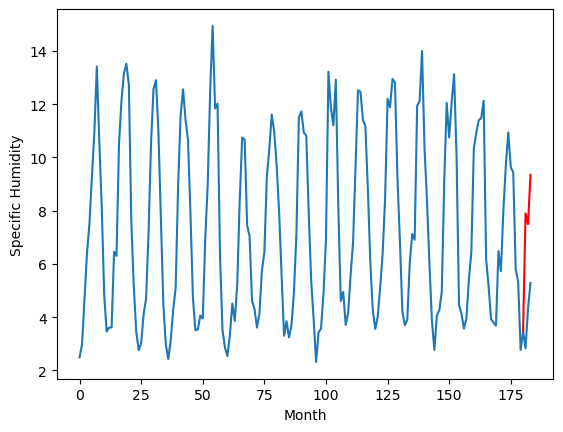

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.88		0.08
6.05		5.48		-0.57
7.76		7.33		-0.43
[180, 181, 182, 183]
[4.52, 5.879884986281395, 5.475994972586632, 7.330404667258263]


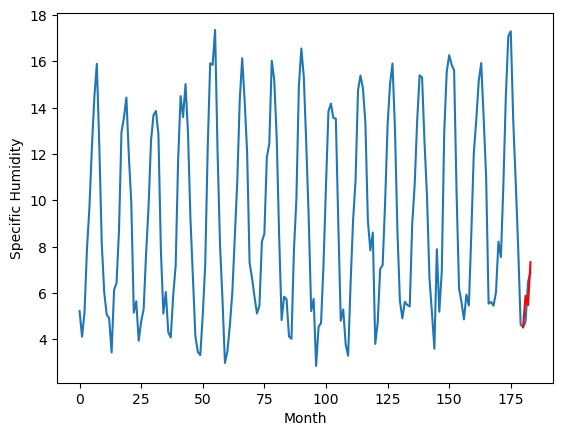

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		4.04		0.11
3.30		3.64		0.34
5.67		5.49		-0.18
[180, 181, 182, 183]
[3.4, 4.0398791860044, 3.6359843443334103, 5.490392012447119]


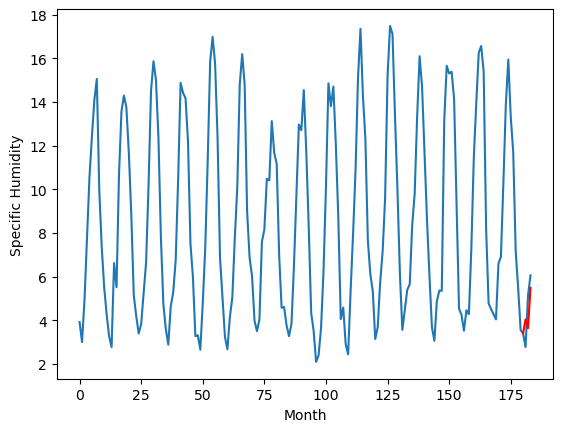

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.61		0.31
2.73		3.21		0.48
4.67		5.06		0.39
[180, 181, 182, 183]
[2.82, 3.6098801545798778, 3.2059882037341594, 5.060397898405791]


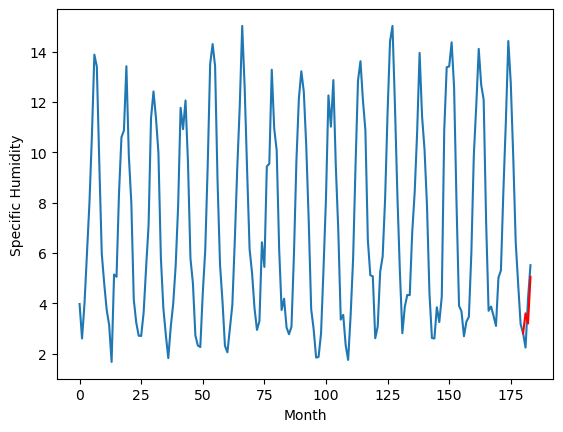

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.45		0.28
1.53		2.05		0.52
3.90		3.90		0.00
[180, 181, 182, 183]
[2.86, 2.4498811194300654, 2.045987261235714, 3.9003939756751063]


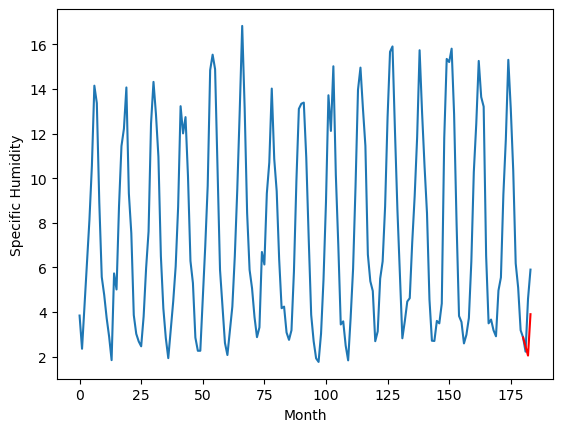

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.18		0.34
4.27		4.78		0.51
5.56		6.63		1.07
[180, 181, 182, 183]
[2.61, 5.179878701716661, 4.775982906371355, 6.630387713462114]


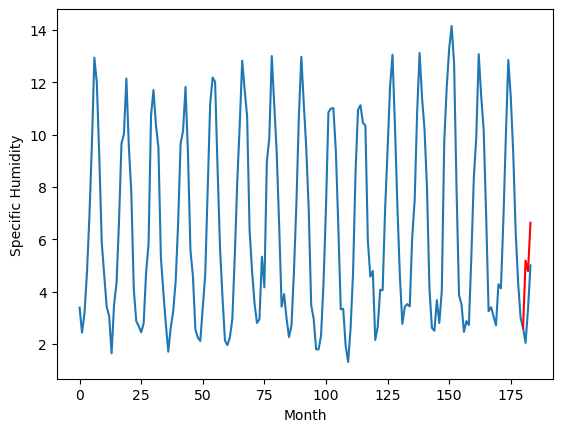

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[5.179878221154213, 3.8798748348653316, 3.939879670292139, 3.799878221154213, 3.359876287728548, 7.899866616874934, 5.879884986281395, 4.0398791860044, 3.6098801545798778, 2.4498811194300654, 5.179878701716661]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   5.179878
1                 1    4.27   3.879875
2                 2    3.87   3.939880
3                 3    3.73   3.799878
4                 4    3.36   3.359876
5                 5    8.64   7.899867
6                 6    5.80   5.879885
7                 7    3.93   4.039879
8                 8    3.30   3.609880
9                 9    2.17   2.449881
10               10    4.84   5.179879


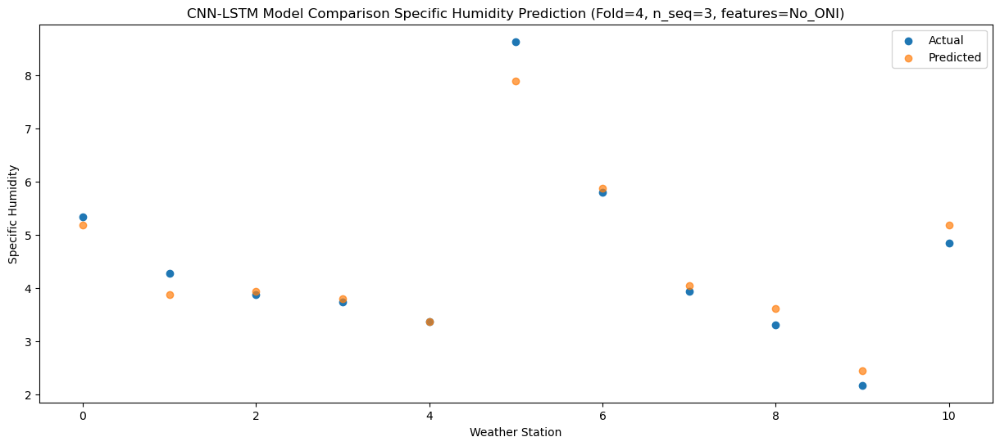

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.775982
1                 1    6.26   3.475977
2                 2    3.75   3.535985
3                 3    3.41   3.395981
4                 4    2.91   2.955978
5                 5    8.00   7.495959
6                 6    6.05   5.475995
7                 7    3.30   3.635984
8                 8    2.73   3.205988
9                 9    1.53   2.045987
10               10    4.27   4.775983


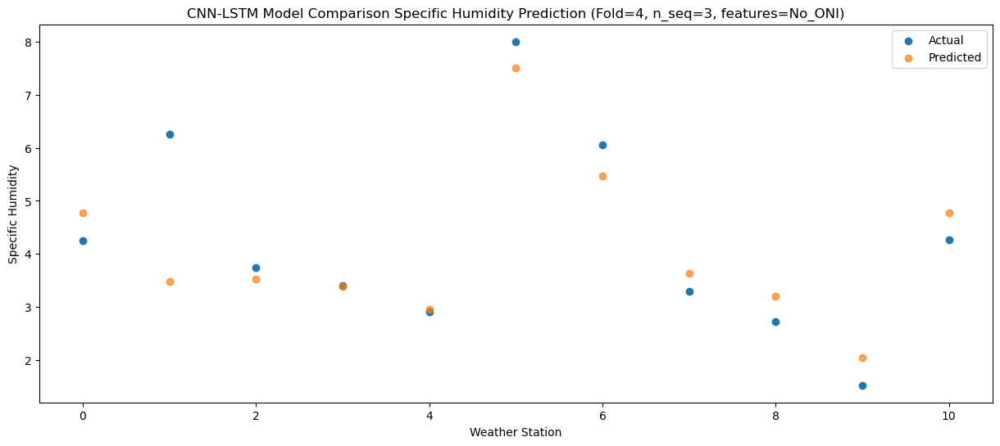

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.630388
1                 1    6.23   5.330381
2                 2    6.81   5.390392
3                 3    6.07   5.250389
4                 4    5.49   4.810384
5                 5    9.49   9.350360
6                 6    7.76   7.330405
7                 7    5.67   5.490392
8                 8    4.67   5.060398
9                 9    3.90   3.900394
10               10    5.56   6.630388


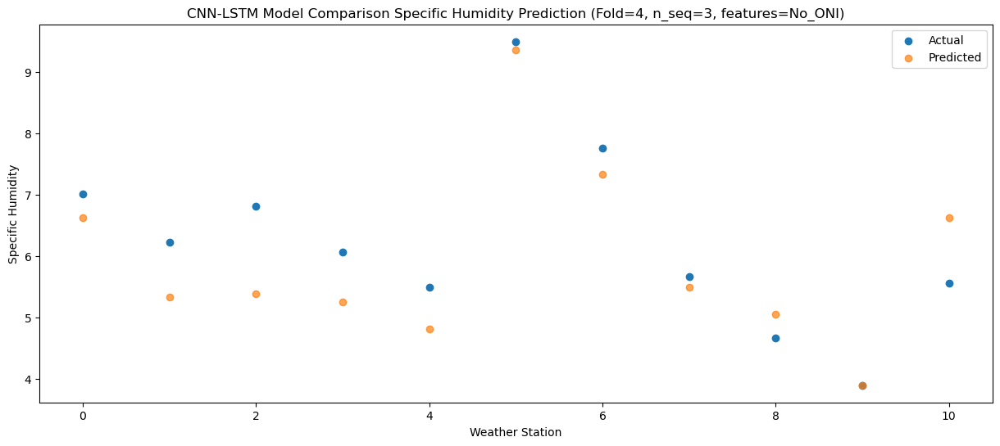

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_27 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_18 (LSTM)              (None, 1, 256)            787456    
                                                                 
 dropout_28 (Dropout)        (None, 1, 256)            0         
                                                                 
 lstm_19 (LSTM)              (None, 256)               525312    
                                                      

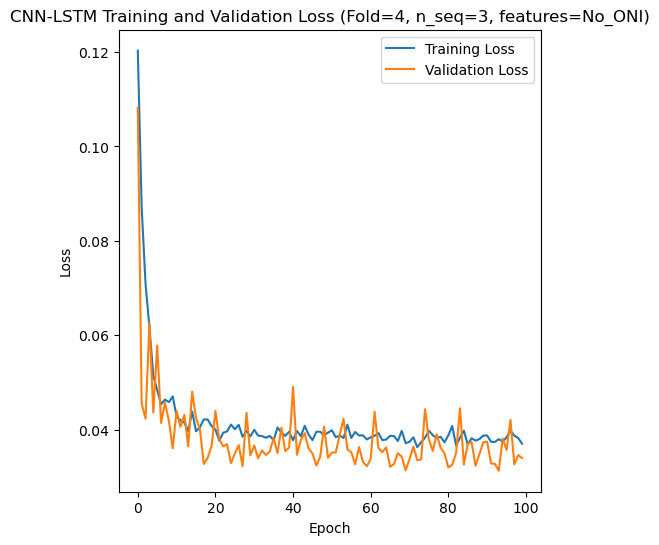

[[0.4648024045039595, 1.1752916757001255, 2.3433267063471197], [0.40202032724308884, 0.41114433144272566, 0.6889430740575443], [0.47191390734466304, 1.0849470174759155, 1.1591996622109066], [0.709981653888027, 0.7826812475058277, 0.709740980385654], [0.30803363635861647, 0.9303375402189418, 0.7158465610906926]]
[[0.383381985534321, 0.9995115321332757, 2.177143779884685], [0.29372881320389843, 0.35931909956715347, 0.591074290113016], [0.34439389583739355, 0.7409697103229435, 0.9617255418679929], [0.5957340322841298, 0.6057055789774113, 0.5526321122863075], [0.23178782534870226, 0.5905460544743322, 0.5825536422973331]]
[[0.07772455881848532, 0.18921399393912405, 0.291676169220969], [0.0715238084492161, 0.08370237045028982, 0.09666635737538117], [0.0780650704921249, 0.15332462847992953, 0.1559150571089892], [0.16192120717403125, 0.1679752748016886, 0.12617654160605876], [0.0526069647153327, 0.13956985197697488, 0.09489063722741405]]
[[0.8030531306644395, 0.19722955242849938, -4.0376881941

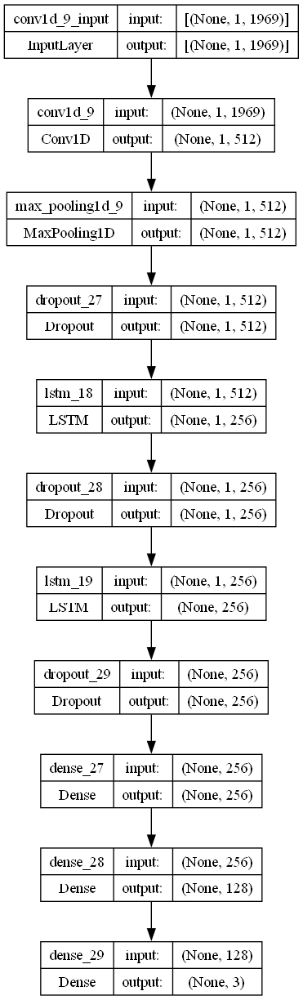

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.0010442745847168585
    optimizer = Adam(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 256
    dropout_rate = 0.15466248449497433

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S3_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)